Vinicius Gomes Pereira
- viniciusgomespe@gmail.com

In [323]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Análise Exploratória de Vinhos

**O que foi feito:**

**1) Análise univariada**
* Estudo da distribuição de cada feature;

* Estudo da distribuição de cada feature em relação ao tipo do vinho (tinto ou branco);
    
**2) Análise Bivariada**

* Separamos as features em 3 grupos (features que medem a acidez, features de compostos químicos, e outras features);

* Analise da correlação feature by feature;

* Analise da correlação de cada feature, com base no tipo de vinho, e na qualidade (baixa,média ou alta);

* Analise da distribuição de cada de cada feature, em relação à qualidade;

* Analise da distribuição de cada feature, em relação à qualidade e tipo de vinho;

* Análise de regressão de cada feature, em relação a outras;

* Análise de regressão de cada feature, em relação a outras, agrupando pelo tipo de vinho;

* Teste de variância (ANOVA), para analisar a distribuição de cada feature, em diversos grupos diferentes (pelo tipo de vinho, pela qualidade de vinho);

**3) Análise Multivariada**
* Análise da distribuição de cada par de features, em respeito à qualidade
    
**4) Modelagem**
   * Fizemos o tuning de parâmetros utilizando Stratified k-fold (para manter a proporção das classes) e GridSearch;
   
   
   * Comparamos os algoritmos utilizando um conjunto de validação, que corresponde a 1/3 dos dados iniciais, mantendo a proporção das classes;
   
   * Plotamos a curva de aprendizagem;
   
   * Plotamos a importância de cada feature
   
   * Confusion Matrix;
   
   * E métricas de precisão (precision, f1-score, recall);
   
   * Modelos Utilizados
   
        1) Regressão Logística, utilizando o algoritmo One Vs The Rest, para problemas de multiclasse
        
        2) Árvores de Decisão
        
        3) Random Forest
        
        4) SVM, utilizando o algoritmo One Vs The Rest, para problemas de multiclasse 
        
        5) xGBoost
        
        6) k - Nearest Neighboors
        
        7) Gaussian Naive Bayes (Baseline)
        
        
   * Aplicamos PCA para redução de dimensionalidade para melhorar a performance da Regressão Logística;
    
   * **Repetimos essa modelagem para prever somente 3 classes (vinhos bons, médios e ruins)**
     

    
    
    
    

In [324]:
##Importando os dados, em um dataframe
df = pd.read_csv("winequality.csv",sep=";")


In [325]:
#Olhando as 5 primeiras colunas
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,White,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,White,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,White,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,White,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,White,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [326]:
#Vamos olhar as informações do dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
type                    6497 non-null object
fixed acidity           6497 non-null float64
volatile acidity        6497 non-null float64
citric acid             6497 non-null float64
residual sugar          6497 non-null float64
chlorides               6497 non-null float64
free sulfur dioxide     6497 non-null float64
total sulfur dioxide    6497 non-null float64
density                 6497 non-null float64
pH                      6497 non-null float64
sulphates               6497 non-null float64
alcohol                 6497 non-null object
quality                 6497 non-null int64
dtypes: float64(10), int64(1), object(2)
memory usage: 659.9+ KB


**Os valores de álcool naõ está do tiṕo float, alguns valaores estão corrompidos no dataset, nós iremos eliminar esses valores. Primeiro, iremos mapear todos os valores para float, depois, os valores que estão corrompidos substituiremos pela média dos valores restantes, avaliando se haverá algum impacto na classificação;**

In [327]:
#Mapeando os valores para float, e sinalizando os valores corrompidos para -1
def map_to_float(value):
  try:
    return float(value)
  except:
    return -1

df["alcohol"] = df["alcohol"].map(lambda x : map_to_float(x))

**Analisando a distribuição de valores errados**

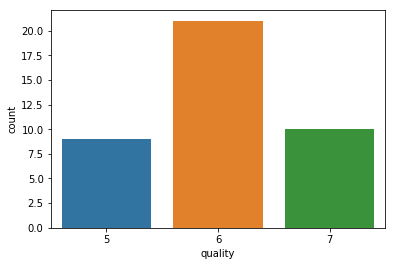

In [328]:
sns.countplot(df[df["alcohol"] == -1]["quality"])

**Analisando a distribuição de valores não errados**


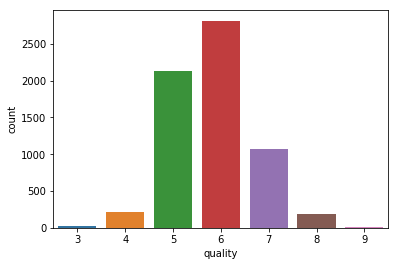

In [329]:
sns.countplot(df[df["alcohol"] != -1]["quality"])

**A maioria dos valores de qualidade são 5, 6 e 7. 
Os valores corrompidos de álcool corrompidos são dessas categorias de qualidade, e são poucos valores, 
iremos substituir esses valores pela média.**

In [330]:
mean_alcohol = df[df["alcohol"]!=-1]["alcohol"].mean()

#Mapeando os valores para float, e sinalizando os valores corrompidos para -1
def map_to_median(x,mean):
  if x ==-1:
    return mean
  else:
    return x

df["alcohol"] = df["alcohol"].map(lambda x : map_to_median(x,mean_alcohol))

**Como o número de classes de qualidade são 7, iremos criar 3 novas classes (vinho ruim, com qualidade menor que 4, vinho médio com qualidade 5 e 6, vinho excelente com qualidade maior ou igual a 7) de modo a analisar também de maneira acertiva**

In [331]:
def map_quality_label(quality):
  if quality <= 4:
    return "Bad"
  if quality>=5 and quality <=6:
    return "Medium"
  if quality>=7:
    return "Great"
    
def map_quality_category(quality):
  if quality <= 4:
    return 0
  if quality>=5 and quality <=6:
    return 1
  if quality>=7:
    return 2

In [332]:
#Basicamente todos os valores são não nulos, do tipo float, menos as variáveis
df["quality_label"] = df["quality"].map(lambda x: map_quality_label(x))
df["quality_category"] = df["quality"].map(lambda x: map_quality_category(x))

In [333]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,1.710882,3.218501,0.531268,10.489083,5.818378,1.158689
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,7.636088,0.160787,0.148806,1.189282,0.873255,0.457456
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,103.898000,4.010000,2.000000,14.900000,9.000000,2.000000


 **Algumas observações**


1) O valor máximo da feature residual_sugar (65.8) é muito maior que sua média (5.44) e seu percentil-75% o que podemos considerar como outlier.

2) O valor máximo de free_sulfur_dioxide  (289.00) é muito maior que sua média (30.52) e  seu percentil-75% (41.00) o que podemos considerar como outlier.

3) O valor 103.898 respectivo ao valor máximo da densidade, claramente é um outlier, o que desloca os valores de médida e variância.


**Alguns valores de densidade estão fora do esperado, um dos líquidos mais densos a temperatura ambiente é o mercúrio, com densidade 13.595 kg/m3 (na S.I.). Assim, iremos remover os valores de desnidade maiores que 10. O esperado é que a densidade do vinho seja parecido com da água**

In [334]:
df = df[df["density"]<10]

In [335]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
count,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000,6361.000000
mean,7.162765,0.338826,0.316019,5.309346,0.055660,30.514542,115.646282,0.994557,3.219679,0.529132,10.508186,5.823141,1.160195
std,1.204989,0.164449,0.143861,4.540402,0.034998,17.693014,55.954360,0.002824,0.160856,0.147824,1.185205,0.873980,0.458971
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.240000,1.800000,0.038000,17.000000,78.000000,0.992260,3.110000,0.430000,9.500000,5.000000,1.000000
50%,7.000000,0.290000,0.310000,2.900000,0.047000,29.000000,118.000000,0.994800,3.210000,0.500000,10.400000,6.000000,1.000000
75%,7.600000,0.400000,0.390000,8.000000,0.064000,41.000000,155.000000,0.996800,3.320000,0.600000,11.300000,6.000000,1.000000
max,15.900000,1.580000,1.660000,22.600000,0.611000,289.000000,440.000000,1.001000,4.010000,2.000000,14.900000,9.000000,2.000000


Os valores de densidade de alcool ficaram na normalidade


**Vamos dividir os vinhos em diversos grupos:**


1.   Grupo de vinhos em relação ao tipo (brancos e tintos)
2.   Grupos de vinhos em relação à qualidade (ruim, média, e ótima)
3.   Grupos de vinho em relação a tipo e qualidade


**Algumas features foram agrupadas:**

1.   Features relacionadas a acidez ("fixed acidity","volatile acidity","citric acid","pH")
2.   Features de compostos químicos ("chlorides","free sulfur dioxide","total sulfur dioxide","sulphates","alcohol")
3.   Features restantes ("residual sugar","density")




In [336]:
#Selecionando os vinhos brancos
df_white = df[df["type"] == "White"]
#Selecionando os vinhos tintos
df_red = df[df["type"] == "Red"]

#Selecionando os vinhos de baixa qualidade
df_bad = df[df["quality_category"] == 0]
#Selecionando os vinhos de média qualidade
df_medium = df[df["quality_category"] == 1]
#Selecionando os vinhos de boa qualidade
df_great = df[df["quality_category"] == 2]

#Selecionando os vinhos brancos de baixa qualidade
df_white_bad = df_white[df_white["quality_category"] == 0]
#Selecionando os vinhos brancos de média qualidade
df_white_medium = df_white[df_white["quality_category"] == 1]
#Selecionando os vinhos brancos de boa qualidade
df_white_great = df_white[df_white["quality_category"] == 2]

#Selecionando os vinhos tintos de baixa qualidade
df_red_bad = df_red[df_red["quality_category"] == 0]
#Selecionando os vinhos tintos de média qualidade
df_red_medium = df_red[df_red["quality_category"] == 1]
#Selecionando os vinhos tintos de boa qualidade
df_red_great = df_red[df_red["quality_category"] == 2]

#Colunas relacionandas a acidez
acid_columns = ["fixed acidity","volatile acidity","citric acid","pH"]

#Colunas relacionadas a compostos químicos
elements_columns = ["chlorides","free sulfur dioxide","total sulfur dioxide","sulphates","alcohol"]

#Outras Colunas
other_columns = ["residual sugar","density"]

#Inputs
columns_data = ['alcohol','chlorides','citric acid','density','fixed acidity','free sulfur dioxide','pH','quality','residual sugar','sulphates','total sulfur dioxide','type','volatile acidity']

# Análise Exploratória

**Distribuição da qualidade de álcool**


1.   Há um maior quantidante de álcool de qualidade média (5,6)
2.   Em relação à qualidade boa (5,6,7), há uma maior quantidade de vinhos de qualidade 7
3.   Há poucos vinhos de qualidade baixa

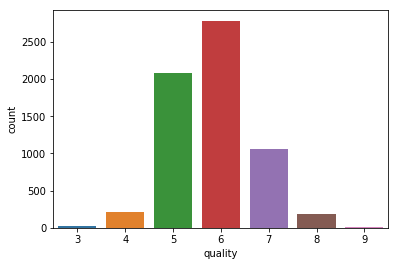

In [337]:
#Distribuição dos Vinhos em relação à qualidade
sns.countplot(x = df.quality, data=df)

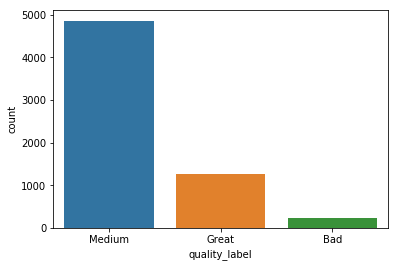

In [338]:
#Distribuição dos vinhos em relação à qualidade
sns.countplot(x = df.quality_label, data=df)

**Distribuição ds vinhos brancos e tintos (vermelhos)**


1.   Há uma maior predominância dos vinhos brancos
2.   Os vinhos brancos são maioria em relação a todas as qualidades
3.   Não há vinhos tintos de qualidade 9

A qualidade média do vinho branco é **5.88** e a qualidade média do vinho tinto é **5.63**



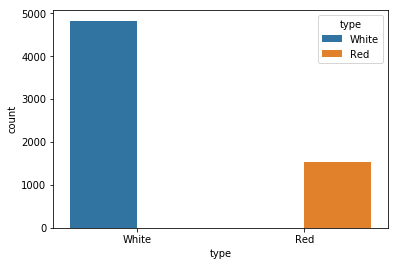

In [339]:

sns.countplot(x = df.type, data=df, hue='type')

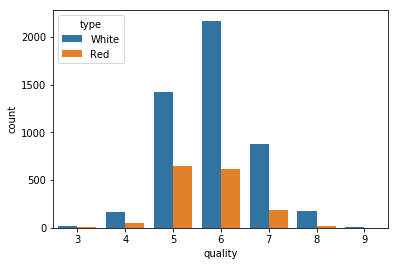

In [340]:
sns.countplot(x = df.quality, data=df,hue="type")

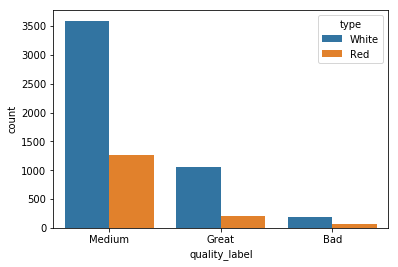

In [341]:
sns.countplot(x = df.quality_label, data=df, hue='type')

In [342]:
print("Qualidade vinho branco: "+str(df_white["quality"].mean()))
print("Qualidade vinho vermelho: "+str(df_red["quality"].mean()))

Qualidade vinho branco: 5.8825357364822874
Qualidade vinho vermelho: 5.636245110821382


**Análise de todas as features agrupando por tipo. Iremos avaliar melhor depois. Porém alguns valores saltam aos olhos, em relação à média:**

1.   Total sulfur dioxide é bem maior em vinhso brancos (137.66) que em vinhos tintos (46.37).
2.   Free sulfur dioxide em vinhos brancos (35.18) é mais que o dobro do que em vinhos tintos (15.84).
3.   Chlorides em vinhos tintos(0.087) é quase o dobro do que em vinhos brancos (0.046)

In [343]:
pd.concat([df_white.describe(), df_red.describe()], axis=0, keys=['White', 'Red']).T

White                                            \
                       count        mean        std      min       25%   
fixed acidity         4827.0    6.842045   0.837340  3.80000    6.3000   
volatile acidity      4827.0    0.278278   0.100505  0.08000    0.2100   
citric acid           4827.0    0.333004   0.120322  0.00000    0.2700   
residual sugar        4827.0    6.215765   4.828415  0.60000    1.7000   
chlorides             4827.0    0.045671   0.021952  0.00900    0.0360   
free sulfur dioxide   4827.0   35.177129  16.983187  2.00000   23.0000   
total sulfur dioxide  4827.0  137.663559  42.038738  9.00000  108.0000   
density               4827.0    0.993919   0.002814  0.98711    0.9917   
pH                    4827.0    3.188809   0.150980  2.72000    3.0900   
sulphates             4827.0    0.488757   0.113253  0.22000    0.4100   
alcohol               4827.0   10.531943   1.221801  8.00000    9.5000   
quality               4827.0    5.882536   0.885767  3.00000    5.0000   
quality_category      4827.0    1.180651   0.472289  0.00000    1.0000   

                                                        Red             \
                           50%         75%      max   count       mean   
fixed acidity           6.8000    7.300000   14.200  1534.0   8.171969   
volatile acidity        0.2600    0.320000    1.100  1534.0   0.529351   
citric acid             0.3200    0.380000    1.660  1534.0   0.262575   
residual sugar          5.1000    9.600000   22.600  1534.0   2.457138   
chlorides               0.0430    0.050000    0.346  1534.0   0.087090   
free sulfur dioxide    34.0000   46.000000  289.000  1534.0  15.842894   
total sulfur dioxide  134.0000  166.000000  440.000  1534.0  46.365059   
density                 0.9937    0.995945    1.001  1534.0   0.996564   
pH                      3.1800    3.280000    3.820  1534.0   3.316819   
sulphates               0.4700    0.550000    1.080  1534.0   0.656180   
alcohol                10.4000   11.400000   14.200  1534.0  10.433432   
quality                 6.0000    6.000000    9.000  1534.0   5.636245   
quality_category        1.0000    1.000000    2.000  1534.0   1.095828   

                                                                           \
                            std      min        25%        50%        75%   
fixed acidity          1.572790  4.60000   7.100000   7.800000   9.000000   
volatile acidity       0.180361  0.12000   0.390000   0.520000   0.640000   
citric acid            0.191101  0.00000   0.090000   0.250000   0.410000   
residual sugar         1.186065  0.90000   1.900000   2.200000   2.500000   
chlorides              0.047558  0.01200   0.070000   0.079000   0.090000   
free sulfur dioxide   10.338471  1.00000   7.000000  14.000000  21.000000   
total sulfur dioxide  33.111339  6.00000  22.000000  37.000000  62.000000   
density                0.001687  0.99007   0.995542   0.996645   0.997607   
pH                     0.152129  2.74000   3.220000   3.320000   3.400000   
sulphates              0.170278  0.33000   0.550000   0.620000   0.720000   
alcohol                1.058749  8.40000   9.500000  10.200000  11.100000   
quality                0.808074  3.00000   5.000000   6.000000   6.000000   
quality_category       0.407779  0.00000   1.000000   1.000000   1.000000   

                               
                          max  
fixed acidity          15.900  
volatile acidity        1.580  
citric acid             1.000  
residual sugar         13.900  
chlorides               0.611  
free sulfur dioxide    72.000  
total sulfur dioxide  289.000  
density                 1.001  
pH                      4.010  
sulphates               2.000  
alcohol                14.900  
quality                 8.000  
quality_category        2.000

**Análise das Features em relação a média dos vinhos ruins, bons e medianos:**

  1.   A média de fixed acidity é decrescente em relação aos vinhos ruins, médios e bons, assim como a média de volatile acidity.
  2.   Citric Acid em compensação é crescente em realação aos vinhos ruins, médios e bons.
  3.   Residual Sugar tem sua maior média nos vinhos médios, menor média nos vinhos ruins.
  4.   Cholorides é descrescente em realação aos vinhos ruins, médios e bons.
  5.   Free Sulfur Dioxide é crescente em realação aos vinhos ruins, médios e bons.
  6.   Total Sulfur Dioxide tem sua maior média nos vinhos médios, menor média nos vinhos ruins.
  7.   As médias de densidade se diferenciam somente na 4a casa decimal, e acredito que seja imperceptível em relação ao paladar humano
  8.   pH tem sua menor média nos vinhos médios, maior média nos vinhos ruins. Ou seja, os vinhos ruins são mais básicos, enquanto os médios são mais ácidos
  9.   Sulphates é crescente em realação aos vinhos ruins, médios e bons.
  10. As médias de álcohol é crescente em realação aos vinhos ruins, médios e bons. Vinhos bons tem mais álcool
  

In [344]:
bad_describe = df_bad.describe()
medium_describe = df_medium.describe()
great_describe = df_great.describe()
pd.concat([bad_describe, medium_describe, great_describe], axis=0, keys=['Bad', 'Medium', 'Great']).T

Bad                                            \
                      count        mean        std     min        25%   
fixed acidity         242.0    7.328926   1.320282  4.2000   6.500000   
volatile acidity      242.0    0.463430   0.245864  0.1100   0.280000   
citric acid           242.0    0.271818   0.179180  0.0000   0.140000   
residual sugar        242.0    4.194008   3.833335  0.7000   1.462500   
chlorides             242.0    0.061971   0.049650  0.0130   0.040000   
free sulfur dioxide   242.0   22.853306  28.045757  3.0000   7.000000   
total sulfur dioxide  242.0  104.756198  67.636419  7.0000  50.250000   
density               242.0    0.994854   0.002453  0.9892   0.993055   
pH                    242.0    3.233884   0.191024  2.7400   3.090000   
sulphates             242.0    0.503760   0.160511  0.2500   0.400000   
alcohol               242.0   10.192355   0.999779  8.0000   9.400000   
quality               242.0    3.884298   0.320531  3.0000   4.000000   
quality_category      242.0    0.000000   0.000000  0.0000   0.000000   

                                                       Medium              \
                             50%         75%      max   count        mean   
fixed acidity           7.100000    8.000000   12.500  4858.0    7.187217   
volatile acidity        0.380000    0.610000    1.580  4858.0    0.345597   
citric acid             0.265000    0.380000    1.000  4858.0    0.314008   
residual sugar          2.200000    5.600000   17.550  4858.0    5.503592   
chlorides               0.050500    0.067750    0.610  4858.0    0.058293   
free sulfur dioxide    15.000000   28.000000  289.000  4858.0   30.748868   
total sulfur dioxide  102.000000  156.250000  440.000  4858.0  117.645327   
density                 0.994995    0.996715    1.001  4858.0    0.994964   
pH                      3.220000    3.360000    3.900  4858.0    3.216711   
sulphates               0.490000    0.570000    2.000  4858.0    0.527740   
alcohol                10.100000   10.900000   13.500  4858.0   10.280826   
quality                 4.000000    4.000000    4.000  4858.0    5.572869   
quality_category        0.000000    0.000000    0.000  4858.0    1.000000   

                       ...                           Great              \
                       ...            75%      max   count        mean   
fixed acidity          ...       7.700000   15.900  1261.0    7.036677   
volatile acidity       ...       0.410000    1.330  1261.0    0.288830   
citric acid            ...       0.390000    1.660  1261.0    0.332252   
residual sugar         ...       8.300000   22.600  1261.0    4.775059   
chlorides              ...       0.069000    0.611  1261.0    0.044303   
free sulfur dioxide    ...      42.000000  131.000  1261.0   31.082078   
total sulfur dioxide   ...     160.000000  344.000  1261.0  110.034893   
density                ...       0.997048    1.001  1261.0    0.992928   
pH                     ...       3.320000    4.010  1261.0    3.228390   
sulphates              ...       0.590000    1.980  1261.0    0.539366   
alcohol                ...      11.000000   14.900  1261.0   11.444703   
quality                ...       6.000000    6.000  1261.0    7.159397   
quality_category       ...       1.000000    1.000  1261.0    2.000000   

                                                                                
                            std      min      25%       50%       75%      max  
fixed acidity          1.237229  3.90000   6.3000    6.8000    7.4000   13.300  
volatile acidity       0.116126  0.08000   0.2000    0.2700    0.3400    0.915  
citric acid            0.107703  0.00000   0.2800    0.3200    0.3800    0.750  
residual sugar         4.008356  0.80000   1.8000    2.9000    6.5000   19.250  
chlorides              0.020907  0.01200   0.0320    0.0390    0.0500    0.358  
free sulfur dioxide   15.265995  3.00000  20.0000   30.0000   40.0000  108.000  
total sulfur 

In [345]:
bad_describe = df_white_bad.describe()
medium_describe = df_white_medium.describe()
great_describe = df_white_great.describe()
pd.concat([bad_describe, medium_describe, great_describe], axis=0, keys=['White Bad', 'White Medium', 'White Great']).T

White Bad                                            \
                         count        mean        std      min       25%   
fixed acidity            181.0    7.167956   1.171547   4.2000   6.40000   
volatile acidity         181.0    0.375552   0.170828   0.1100   0.26000   
citric acid              181.0    0.306630   0.157559   0.0000   0.20000   
residual sugar           181.0    4.703315   4.197551   0.7000   1.30000   
chlorides                181.0    0.050475   0.028848   0.0130   0.03700   
free sulfur dioxide      181.0   26.555249  31.163944   3.0000   9.00000   
total sulfur dioxide     181.0  128.668508  60.074149  10.0000  85.00000   
density                  181.0    0.994278   0.002439   0.9892   0.99256   
pH                       181.0    3.183702   0.169142   2.8300   3.06000   
sulphates                181.0    0.474530   0.117679   0.2500   0.38000   
alcohol                  181.0   10.175414   1.027708   8.0000   9.40000   
quality                  181.0    3.895028   0.307368   3.0000   4.00000   
quality_category         181.0    0.000000   0.000000   0.0000   0.00000   

                                                     White Medium              \
                            50%        75%       max        count        mean   
fixed acidity           6.90000    7.60000   11.8000       3593.0    6.862288   
volatile acidity        0.32000    0.45000    1.1000       3593.0    0.277026   
citric acid             0.30000    0.40000    0.8800       3593.0    0.336596   
residual sugar          2.70000    7.10000   17.5500       3593.0    6.591358   
chlorides               0.04600    0.05400    0.2900       3593.0    0.047649   
free sulfur dioxide    18.00000   33.00000  289.0000       3593.0   35.817423   
total sulfur dioxide  118.00000  175.00000  440.0000       3593.0  141.841080   
density                 0.99405    0.99588    0.9999       3593.0    0.994357   
pH                      3.16000    3.29000    3.7200       3593.0    3.181333   
sulphates               0.46000    0.54000    0.8700       3593.0    0.486438   
alcohol                10.10000   10.80000   13.5000       3593.0   10.287895   
quality                 4.00000    4.00000    4.0000       3593.0    5.604230   
quality_category        0.00000    0.00000    0.0000       3593.0    1.000000   

                       ...                       White Great              \
                       ...          75%      max       count        mean   
fixed acidity          ...       7.4000   14.200      1053.0    6.716952   
volatile acidity       ...       0.3200    0.905      1053.0    0.265831   
citric acid            ...       0.3900    1.660      1053.0    0.325280   
residual sugar         ...      10.2000   22.600      1053.0    5.194160   
chlorides              ...       0.0510    0.346      1053.0    0.038096   
free sulfur dioxide    ...      47.0000  131.000      1053.0   34.474359   
total sulfur dioxide   ...     172.0000  344.000      1053.0  124.955366   
density                ...       0.9964    1.001      1053.0    0.992359   
pH                     ...       3.2600    3.810      1053.0    3.215195   
sulphates              ...       0.5400    1.060      1053.0    0.499117   
alcohol                ...      11.0000   14.000      1053.0   11.425956   
quality                ...       6.0000    6.000      1053.0    7.173789   
quality_category       ...       1.0000    1.000      1053.0    2.000000   

                                                                           \
                            std       min        25%        50%       75%   
fixed acidity          0.764623   3.90000    6.20000    6.70000    7.2000   
volatile acidity       0.094201   0.08000    0.19000    0.25000    0.3200   
citric acid            0.079655   0.01000    0.28000    0.31000    0.3600   
residual sugar         4.222344   0.80000    1.80000    3.80000    7.4000   
chlorides              0.011150   0.01200    0.03100    0.036

In [346]:
bad_describe = df_red_bad.describe()
medium_describe = df_red_medium.describe()
great_describe = df_red_great.describe()
pd.concat([bad_describe, medium_describe, great_describe], axis=0, keys=['Red Bad', 'Red Medium', 'Red Great']).T

Red Bad                                          \
                       count       mean        std     min       25%   
fixed acidity           61.0   7.806557   1.604355  4.6000   6.80000   
volatile acidity        61.0   0.724180   0.250674  0.2300   0.55000   
citric acid             61.0   0.168525   0.199949  0.0000   0.02000   
residual sugar          61.0   2.682787   1.749307  1.2000   1.90000   
chlorides               61.0   0.096082   0.076311  0.0450   0.06800   
free sulfur dioxide     61.0  11.868852   9.043368  3.0000   5.00000   
total sulfur dioxide    61.0  33.803279  26.554234  7.0000  13.00000   
density                 61.0   0.996563   0.001537  0.9934   0.99565   
pH                      61.0   3.382787   0.174939  2.7400   3.30000   
sulphates               61.0   0.590492   0.227409  0.3300   0.49000   
alcohol                 61.0  10.242623   0.918097  8.4000   9.60000   
quality                 61.0   3.852459   0.357588  3.0000   4.00000   
quality_category        61.0   0.000000   0.000000  0.0000   0.00000   

                                                 Red Medium             \
                           50%      75%      max      count       mean   
fixed acidity          7.50000   8.4000   12.500     1265.0   8.110119   
volatile acidity       0.68000   0.8850    1.580     1265.0   0.540360   
citric acid            0.08000   0.2700    1.000     1265.0   0.249850   
residual sugar         2.10000   2.8000   12.900     1265.0   2.413992   
chlorides              0.08000   0.0930    0.610     1265.0   0.088525   
free sulfur dioxide    9.00000  15.0000   41.000     1265.0  16.352569   
total sulfur dioxide  24.00000  48.0000  119.000     1265.0  48.921739   
density                0.99652   0.9976    1.001     1265.0   0.996688   
pH                     3.38000   3.5000    3.900     1265.0   3.317194   
sulphates              0.56000   0.6000    2.000     1265.0   0.645051   
alcohol               10.00000  11.0000   13.100     1265.0  10.260747   
quality                4.00000   4.0000    4.000     1265.0   5.483794   
quality_category       0.00000   0.0000    0.000     1265.0   1.000000   

                       ...                      Red Great             \
                       ...         75%      max     count       mean   
fixed acidity          ...      8.9000   15.900     208.0   8.655288   
volatile acidity       ...      0.6400    1.330     208.0   0.405264   
citric acid            ...      0.3900    0.780     208.0   0.367548   
residual sugar         ...      2.5000   13.900     208.0   2.653365   
chlorides              ...      0.0900    0.611     208.0   0.075726   
free sulfur dioxide    ...     22.0000   72.000     208.0  13.908654   
total sulfur dioxide   ...     65.0000  165.000     208.0  34.500000   
density                ...      0.9978    1.001     208.0   0.995811   
pH                     ...      3.4100    4.010     208.0   3.295192   
sulphates              ...      0.7000    1.980     208.0   0.743125   
alcohol                ...     10.9000   14.900     208.0  11.539611   
quality                ...      6.0000    6.000     208.0   7.086538   
quality_category       ...      1.0000    1.000     208.0   2.000000   

                                                                          \
                            std      min        25%       50%        75%   
fixed acidity          1.787090  4.90000   7.300000   8.65000  10.000000   
volatile acidity       0.143782  0.12000   0.300000   0.37000   0.482500   
citric acid            0.191998  0.00000   0.300000   0.39000   0.490000   
residual sugar         1.332930  1.20000   1.900000   2.30000   2.612500   
chlorides              0.028993  0.01200   0.062000   0.07200   0.085250   
free sulfur dioxide    9.892847  3.00000   6.000000  11.00000  18.000000   
total sulfur dioxide  33.016904  7.00000  16.000000  25.50000  43.000000   
density                0.001959  0.99064   0.994665   0.99559   

## Análise Univariada

In [347]:
def ploat_histogram_agregating_by_type(df):
  colors = ["#5cb85c","#5bc0de","#d9534f"]
  df_red = df[df["type"]=="Red"]
  df_white = df[df["type"]=="White"]
  fig, axes = plt.subplots(nrows=4, ncols=3,figsize=(20,20))
  ax00, ax01, ax02, ax10, ax11, ax12, ax20,ax21,ax22, ax30, ax31, ax32  = axes.flatten()
  
  sns.distplot(df_white["fixed acidity"],ax=ax00,color=colors[0])
  sns.distplot(df_red["fixed acidity"],ax=ax00,color=colors[2])
  ax00.set_title('Fixed Acidity')

  sns.distplot(df_white["volatile acidity"],ax=ax01, color = colors[0])
  sns.distplot(df_red["volatile acidity"],ax=ax01, color = colors[2])
  ax01.set_title('Volatile Acidity')

  
  
  sns.distplot(df_white["citric acid"],ax=ax02, color = colors[0])
  sns.distplot(df_red["citric acid"],ax=ax02, color = colors[2])
  ax02.set_title('Citric Acid')

  sns.distplot(df_white["chlorides"], ax=ax10, color = colors[0])
  sns.distplot(df_red["chlorides"], ax=ax10, color = colors[2])
  ax10.set_title('Chlorides')

  
  sns.distplot(df_white["free sulfur dioxide"] ,ax=ax11, color = colors[0])
  sns.distplot(df_red["free sulfur dioxide"] ,ax=ax11, color = colors[2])
  ax11.set_title('Free sulfur dioxide')


  sns.distplot(df_red["total sulfur dioxide"],ax=ax12, color = colors[0])
  sns.distplot(df_white["total sulfur dioxide"],ax=ax12, color = colors[2])
  ax12.set_title("Total Sulfur Dioxide")


  sns.distplot(df_white["density"],ax=ax20, color = colors[0])
  sns.distplot(df_red["density"],ax=ax20, color = colors[2])
  ax20.set_title("Density")


  sns.distplot(df_white["pH"],ax=ax21, color = colors[0])
  sns.distplot(df_red["pH"],ax=ax21, color = colors[2])
  ax21.set_title("pH")

  
  sns.distplot(df_white["sulphates"],ax=ax22, color = colors[0])
  sns.distplot(df_red["sulphates"],ax=ax22, color = colors[2])
  ax22.set_title("Sulphates")

  
  sns.distplot(df_white["alcohol"], ax=ax30, color = colors[0])
  sns.distplot(df_red["alcohol"], ax=ax30, color = colors[2])
  ax30.set_title("Alcohol")


  sns.distplot(df_white["residual sugar"],ax=ax31, color = colors[0])
  sns.distplot(df_red["residual sugar"],ax=ax31, color = colors[2])
  ax31.set_title("Residual Sugar")


  sns.distplot(df_white["quality"], ax=ax32, color = colors[0])
  sns.distplot(df_red["quality"], ax=ax32, color = colors[2])
  ax32.set_title("Quality")


def ploat_histogram(df):
  colors = ["#5cb85c","#5bc0de","#d9534f"]

  fig, axes = plt.subplots(nrows=4, ncols=3,figsize=(20,20))
  ax00, ax01, ax02, ax10, ax11, ax12, ax20,ax21,ax22, ax30, ax31, ax32  = axes.flatten()
  
  sns.distplot(df["fixed acidity"],ax=ax00,color=colors[0]);
  ax00.set_title('Fixed Acidity')


  sns.distplot(df["volatile acidity"],ax=ax01, color = colors[1])
  ax01.set_title('Volatile Acidity')

  sns.distplot(df["citric acid"],ax=ax02, color = colors[2])
  ax02.set_title('Citric Acid')

  sns.distplot(df["chlorides"], ax=ax10, color = colors[0])
  ax10.set_title('Chlorides')

  sns.distplot(df["free sulfur dioxide"] ,ax=ax11, color = colors[1])
  ax11.set_title('Free sulfur dioxide')



  sns.distplot(df["total sulfur dioxide"],ax=ax12, color = colors[2])
  ax12.set_title("Total Sulfur Dioxide")



  sns.distplot(df["density"],ax=ax20, color = colors[0])
  ax20.set_title("Density")



  sns.distplot(df["pH"],ax=ax21, color = colors[1])
  ax21.set_title("pH")

  sns.distplot(df["sulphates"],ax=ax22, color = colors[2])
  ax22.set_title("Sulphates")

  sns.distplot(df["alcohol"], ax=ax30, color = colors[0])
  ax30.set_title("Alcohol")



  sns.distplot(df["residual sugar"],ax=ax31, color = colors[1])
  ax31.set_title("Residual Sugar")



  sns.distplot(df["quality"], ax=ax32, color = colors[2])
  ax32.set_title("Quality")



**Analisando os gŕaficos das distribuições das features**

  1) A distribuição de fixed acidity é normal, enviesada à esquerda, com média com x entre 6 e 8;
  
  2) A distribuição de volatile acidity tem um máximo global perto de x = 0.25 e uns máximo local com x entre 0.5 e 0.75, e é enviesada à esquerda
  
  3) A distribuição de citric acid tem 3 máximos locais principais (perto de x = 0, x entre 0.25 e 0.375 e x  perto de 0.5), e é enviesada à esquerda
  
  4) A distribuição de Chlorides é enviesada á esquerda com um máximo global perto de x= 0.5
  
  5) A distribuição de Free Sulfur Dioxide é normal, enviesada à esquerda, com média perrto de x= 30
  
  6) A distribuição de total sulfur dioxide é bimodal
  
  7) A distribuição de Density é bimodal
  
  8) A distribuição de pH é normal, com média perto de 3.2
  
  9) A distribuição de Sulphates é normal enviesada à esquerda
  
  10) A distribuição de álcool tem máximo global perto de x = 9.75
  
  11) A distribuição de residual sugar é enviesada à esquerda, com máximo global perto de x=2.5



/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/pyth

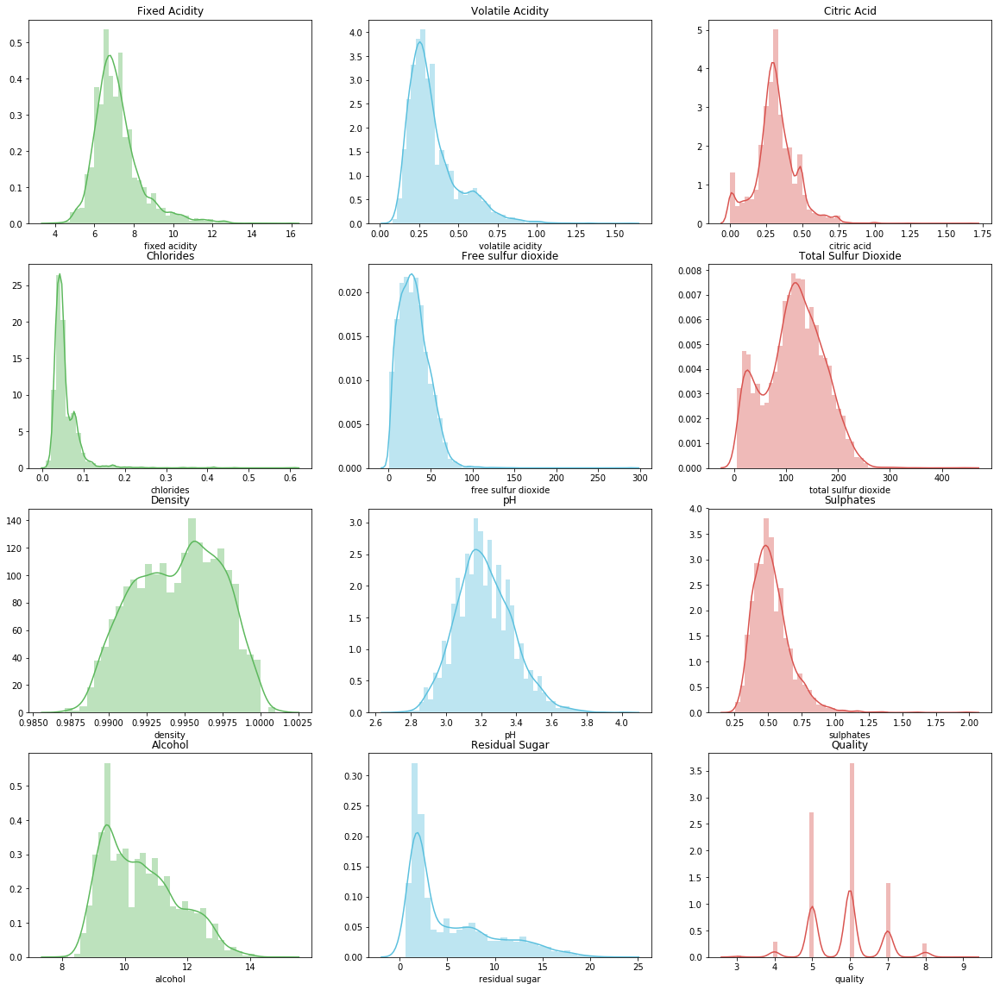

In [348]:
ploat_histogram(df)

É possível explicar um pouco das distribuições acima, analisando separadamente as distribuições dos vinhos tintos e brancos que se comportam de maneira diferente.


  1) A distribuição normal do pH pode ser explicada pelo fato das distribuições normais dos vinhos tintos e brancos serem normais com médias em torno de 3.4 e 3.1, aproximadamente, gerando uma distribuição normal com média 3.2, aproximadamente

  2) A distribuição bimodal de total sulfur dioxide pode ser explicada por duas distribuições normais dos vinhos tintos e brancos, com média separadas o suficiente entre si.

```

```




/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/lexlabs/anaconda3/lib/pyth

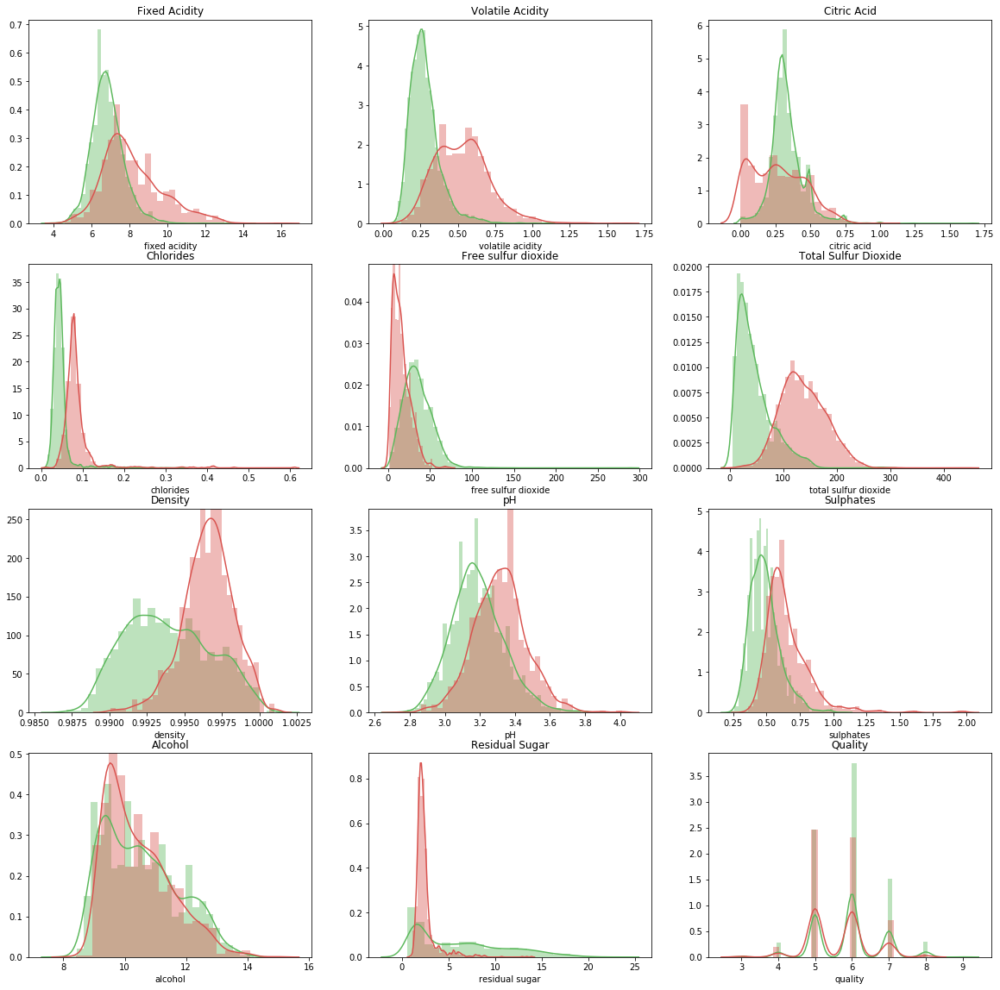

In [349]:
ploat_histogram_agregating_by_type(df)

## Análise Bivariada



Plotando em um heatmap a correlação entre as features.  Pimeiro analizamos sem nenhum agrupamento, em seguida, avaliamos somente para vinhos tintos e somente para vinhos brancos. Depois avaliamos para os vinhos ruins, médios e bons.
Há uma melhor análise de correlação, estudando os gráficos de correlação linear entre as features na próxima sessão.

###  Correlação dos Vinhos


As correlações com valores em módulo acima de 0.4:

1) Total sulfur dioxide tem uma alta correlação com free sulfur dioxide (0.72) , alta correlação com residual sugar (0.49) , e uma correlação negativa  com volatile acidity (-0.41);

2) Citric Acid tem uma correção negativa com volatile acid (-0.4);

3) Alcohol tem uma correlação negativa acentuada com densidade (-0.71) e uma correlação positiva com quality (0.45);

4) Fixed Acid tem uma relação postiva acentuada com a densidade (0.43);

5) Density tem uma correlação positiva com residual sugar (0.53);

6) Residual Sugar tem correlação postiva com free sulfur dioxide (0.41)

**As correlações mais acentuadas em relação à qualidade é : alcohol (0.45), density (-0.32) e volatile acid (-0.27)**

---



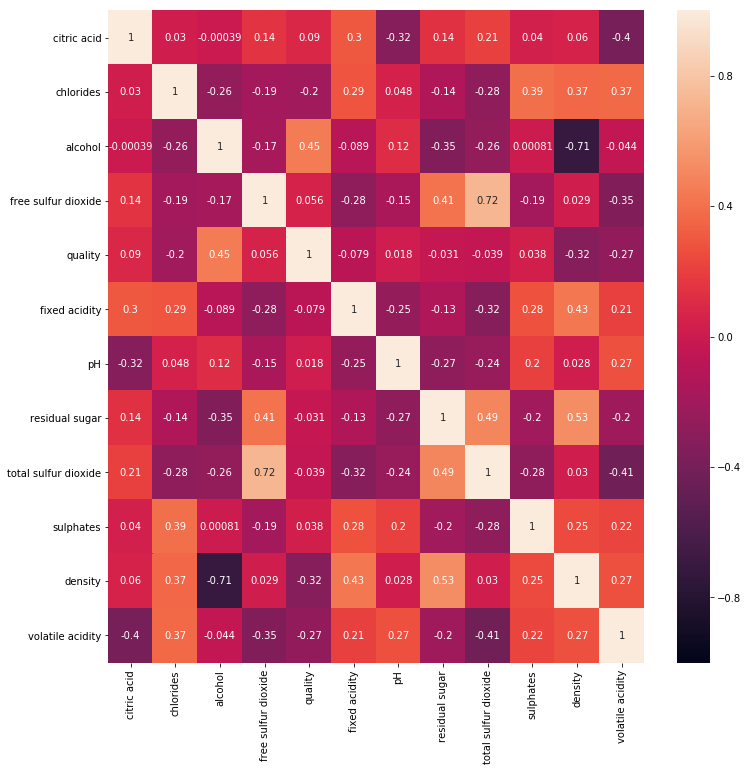

In [350]:
plt.figure(figsize=(12, 12))
sns.heatmap(df[list(set(df.columns)-set(["quality_category"]))].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

**Correlação dos Vinhos Brancos**


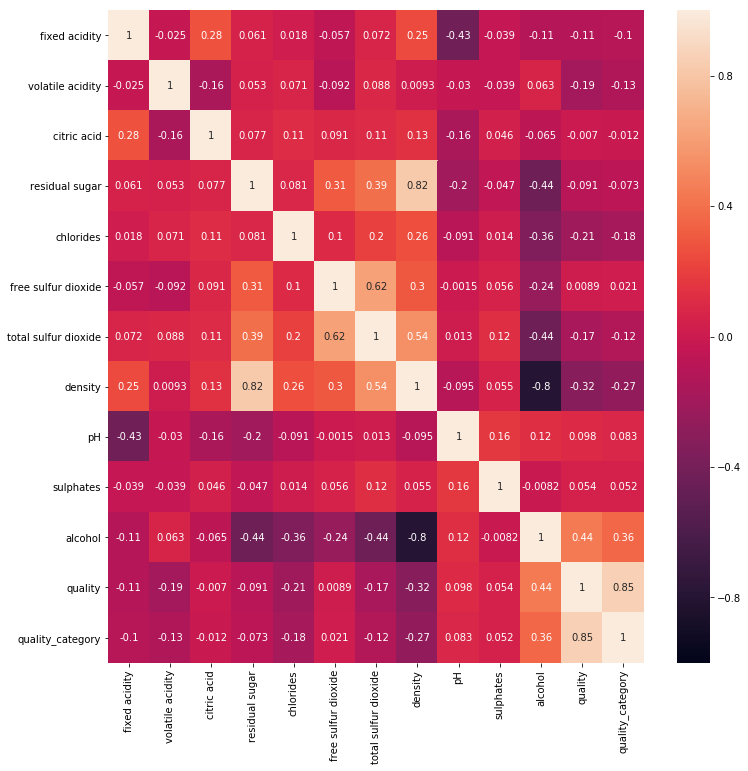

In [351]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_white.corr(),vmin=-1,vmax=1,annot=True,cbar=True)

**Correlação dos Vinhos Vermelhos**




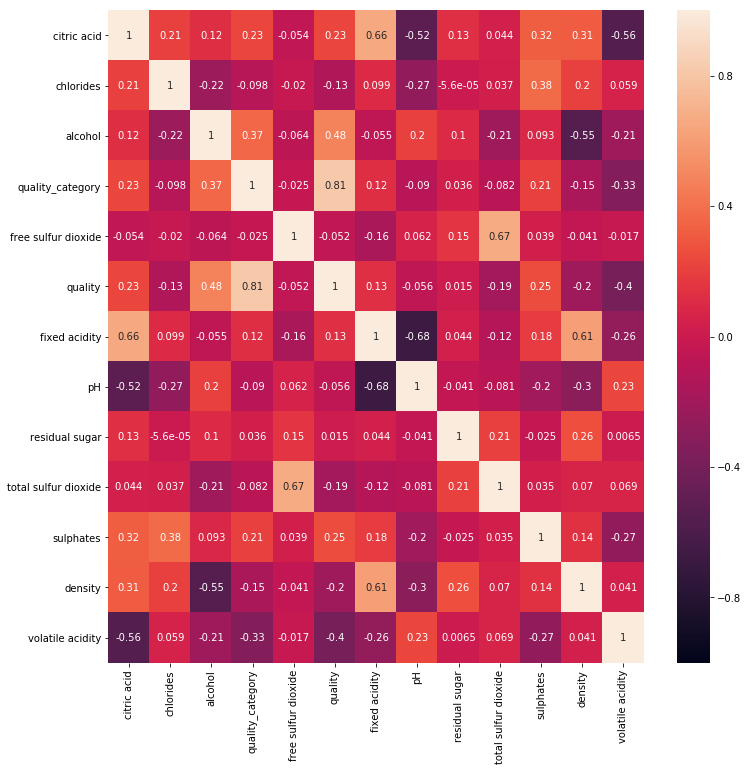

In [352]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_red[list(set(df_red.columns)-set("quality_category"))].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

**A seguir, plotamos o heatmap dos vinhos considerados ruins, médios e bons, porém, não há grande mudança de correlação em relação à qualidade de maneira notória.**

**Correlação dos Vinhos Considerados ruims**


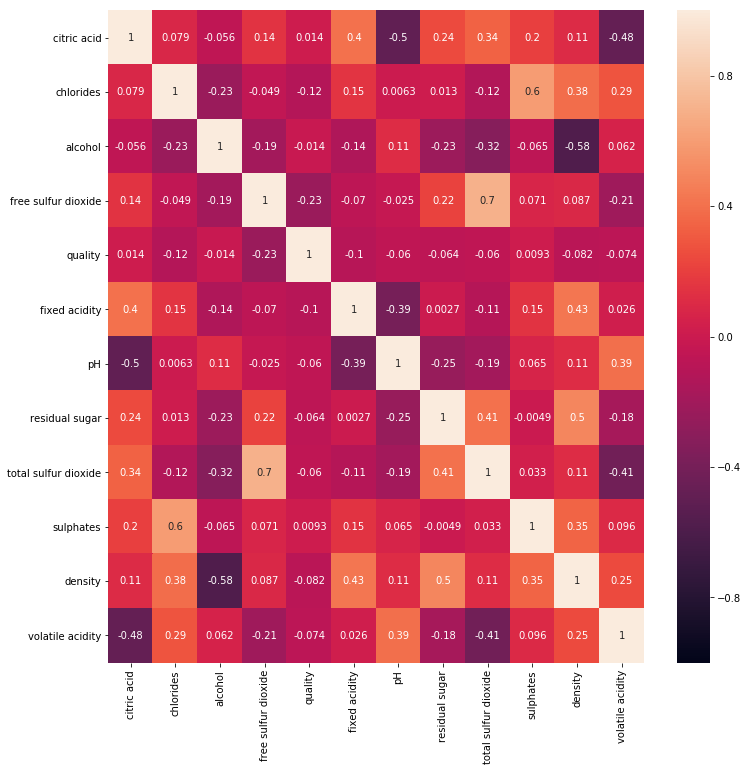

In [353]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_bad[list(set(df_bad.columns)-set(["quality_category"]))].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

**Correlação dos Vinhos Considerados Médios**






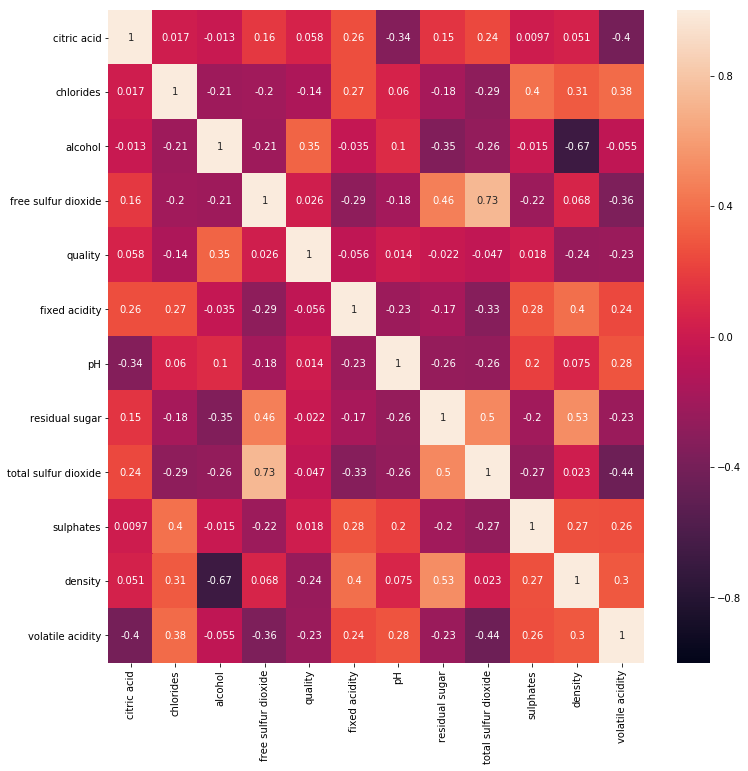

In [354]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_medium[list(set(df_medium.columns)-set(["quality_category"]))].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

**Correlação dos Vinhos Considerados Bons**


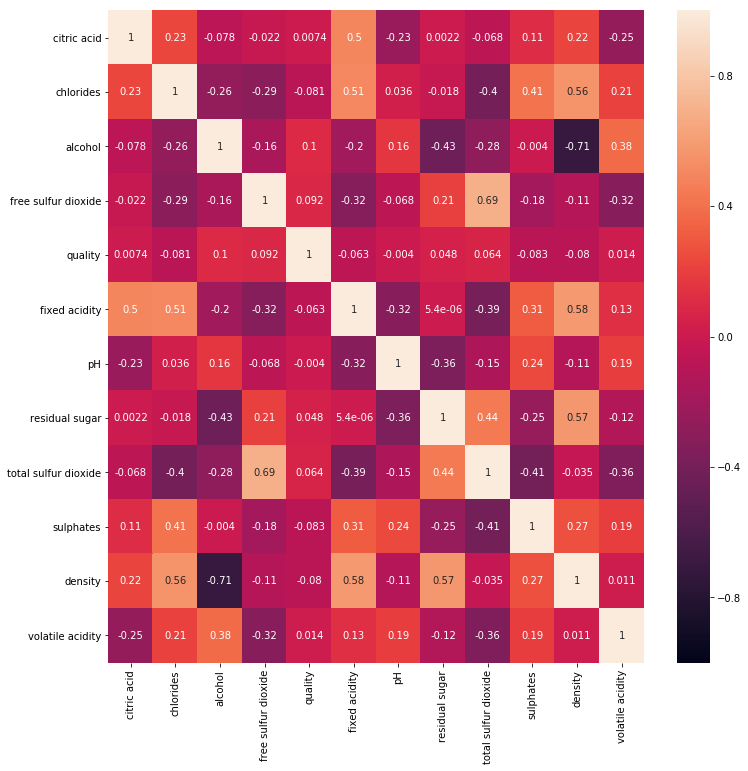

In [355]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_great[list(set(df_great.columns)-set(["quality_category"]))].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

**Em seguida plotamos também um heatmap para destacar as features de acidez, em seguida outro heatmap para destacar as features de compostos químicos, em seguida as features restantes;**

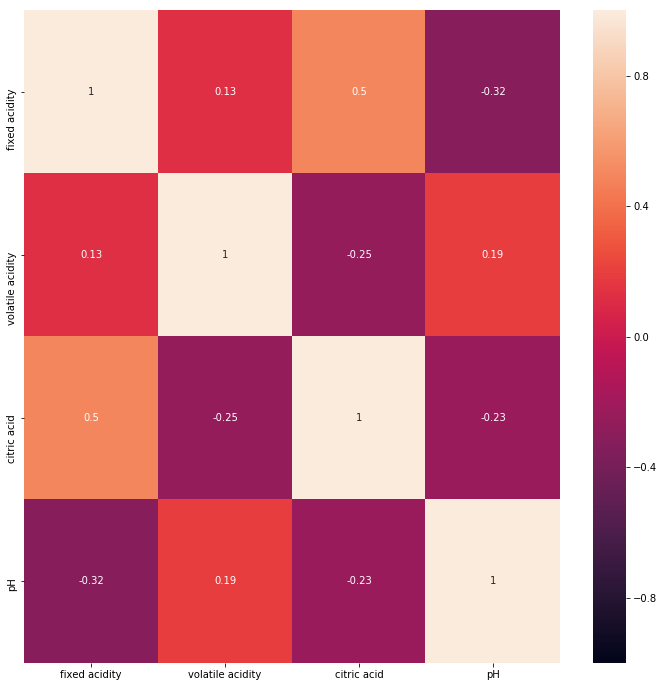

In [356]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_great[acid_columns].corr(),vmin=-1,vmax=1,annot=True,cbar=True)




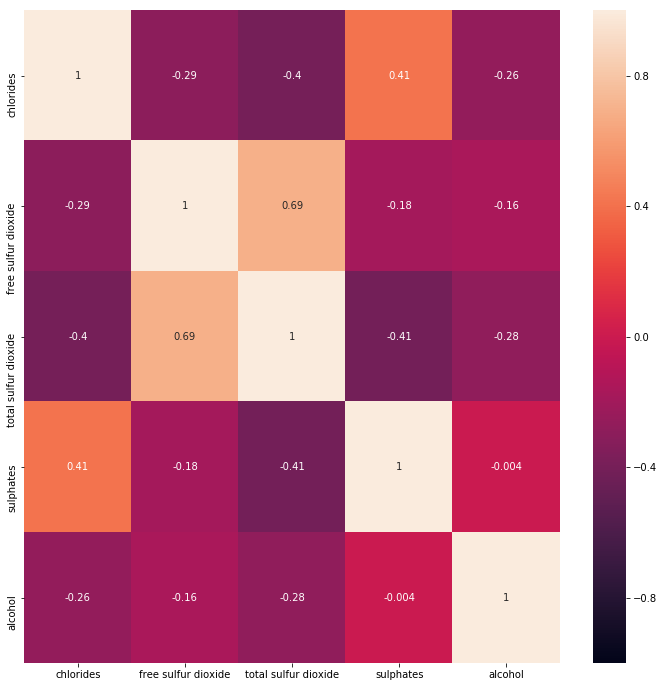

In [357]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_great[elements_columns].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

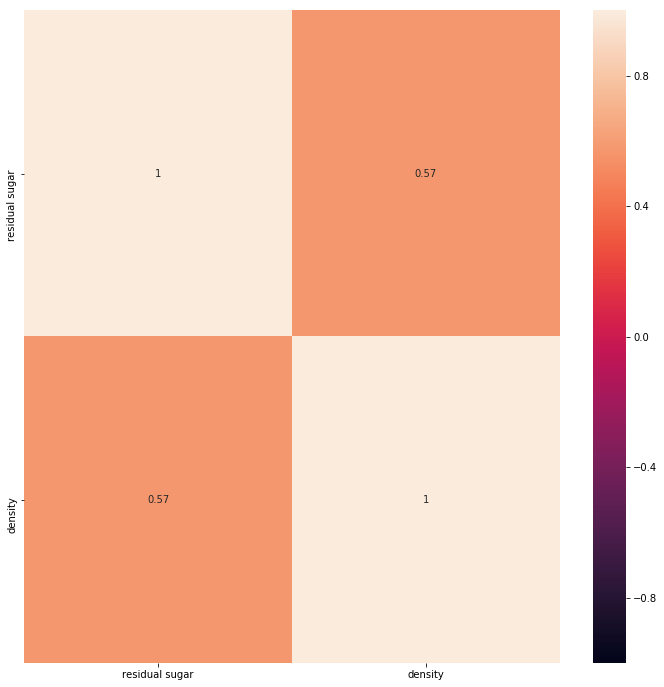

In [358]:
plt.figure(figsize=(12, 12))
sns.heatmap(df_great[other_columns].corr(),vmin=-1,vmax=1,annot=True,cbar=True)

###  Análise em Relação à Qualidade



In [359]:
def plot_box_plot(df,nrows,ncols,figsize,columns,by): 
  fig = plt.figure(figsize=figsize)
  index=0
  for element in range(nrows*ncols):
      ax = fig.add_subplot(nrows,ncols,element+1)
      g = sns.boxplot(x="quality", y=columns[element], hue="quality_label", data=df, palette="Set3",ax=ax)
      ax.get_legend().set_visible(False)

def plot_box_plot_by_type(df,nrows,ncols,figsize,columns,by): 
  fig = plt.figure(figsize=figsize)
  index=0
  for element in range(nrows*ncols):
      ax = fig.add_subplot(nrows,ncols,element+1)
      g = sns.boxplot(x="quality", y=columns[element], hue="type", data=df,ax=ax,palette="Set2")
      ax.get_legend().set_visible(False)

**Análise de Outros Elementos em Relação à Qualidade**

Iremos analizar o grupo que consideramos como "outros elementos" (densidade, álcool e residual sugar) , em relação à qualidade.

Há uma discriminação em relação à qualidade baixa, média e alta nos gráficos boxplot


1) Conseguimos perceber um caŕater descrescente na densidade em relação à qualidade, e um caráter crescente do álcool em relação à qualidade. 

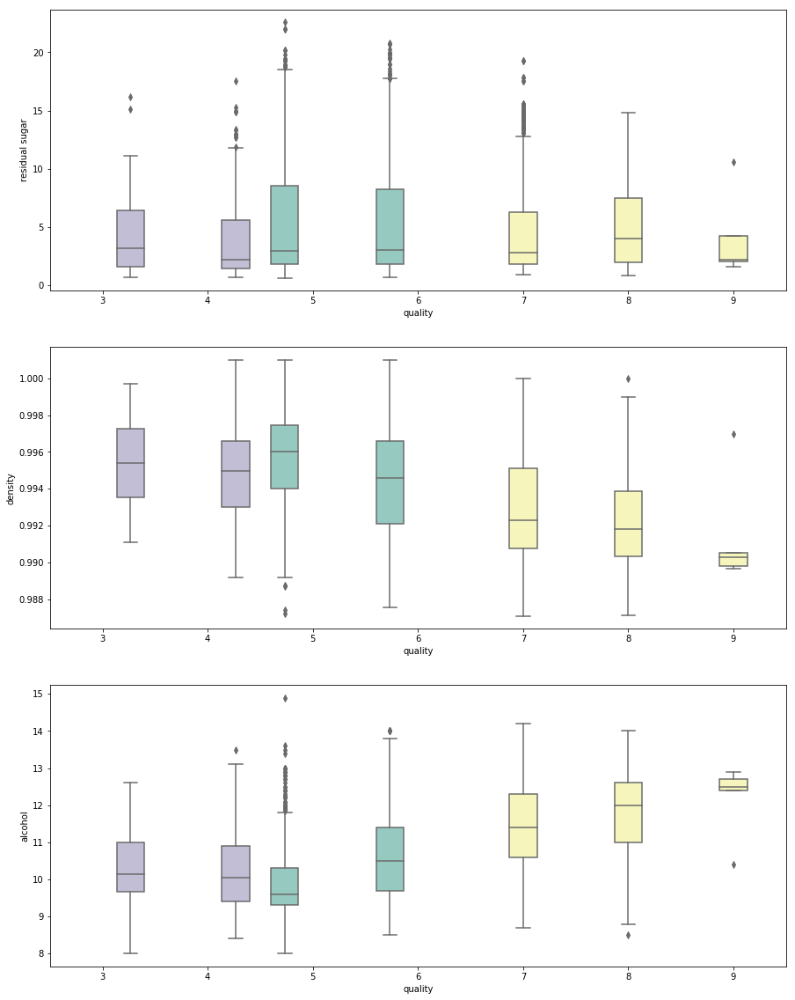

In [360]:
plot_box_plot(df,3,1,(15,20),['residual sugar','density','alcohol'],"quality_category")


**Análise do Grupo de Compostos Químicos em Relação à Qualidade**


Iremos analizar o grupo que consideramos como "compostos químicos" (chlorides','free sulfur dioxide','total sulfur dioxide','sulphatesr) , em relação à qualidade.

1) Conseguimos perceber uma tentência descrente da média de chlorides, em relação ao aumento da qualidade

2) Conseguimos perceber uma tentência crescente da média de free sulfur dioxide, em relação ao aumento da qualidade

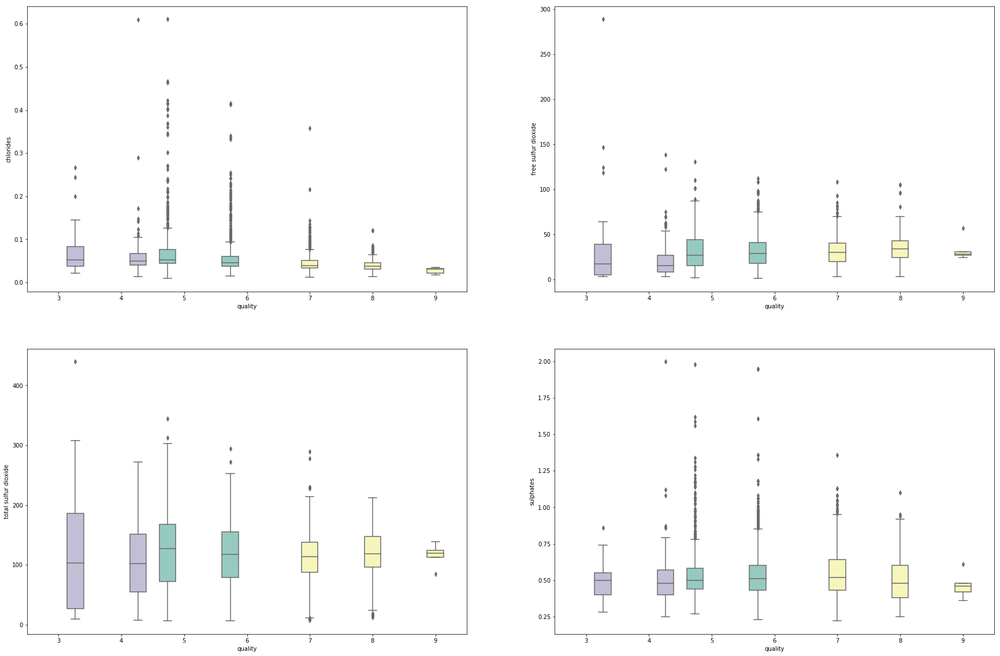

In [361]:
plot_box_plot(df,2,2,(30,20),['chlorides','free sulfur dioxide','total sulfur dioxide','sulphates'],"quality_category")


**Análise dos Elementos Ácidos**

1) Citric Acid é crescente em relação ao aumento da qualidade

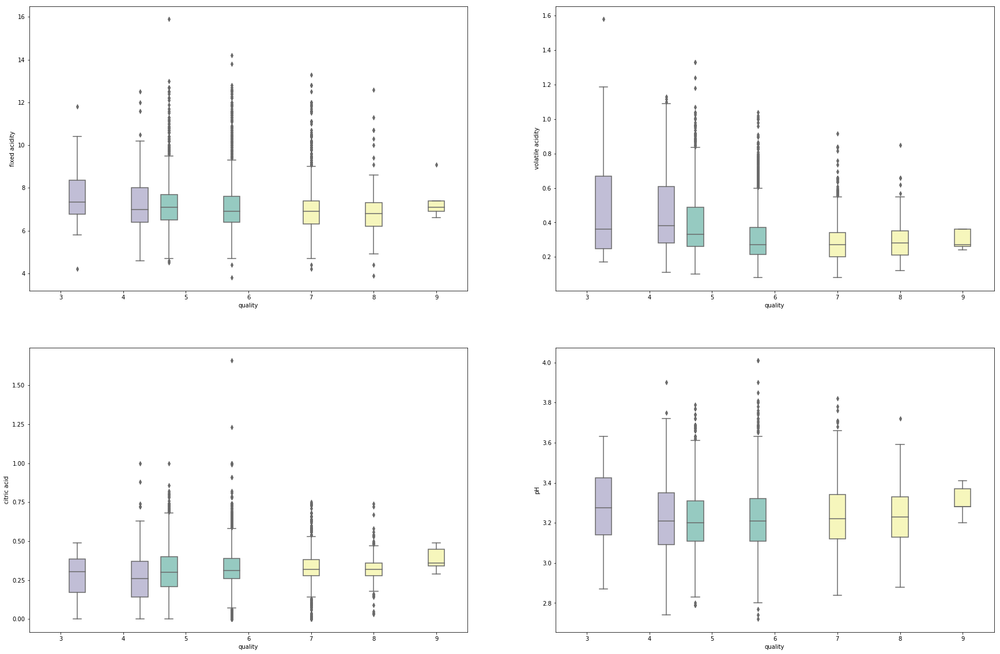

In [362]:
plot_box_plot(df,2,2,(30,20),['fixed acidity','volatile acidity','citric acid','pH'],"quality_category")


### Análise dos Elementos em Relação à Qualidade, agrupados pelo tipo de vinho

A análise dos padrãos de crescimento das features em relação à qualidade, é bem mais demarcada quando analisamos o tipo de vinho. Como veremos a seguir.

**Análise em relação ao grupo outros elementos  (residual sugar, density e alcohol)**

1) Em relação ao residual sugar e o vinho tinto, perbemos pouca variação em relação à qualidade, e há mais variação no vinho branco desse elemento;

2) Em relação a density, há uma padrão de decrescimento em relação à qualidade, em ambos os casos;

3) Há um padrão de crescimento em relação à qualidade, em ambos os tipos de vinho;

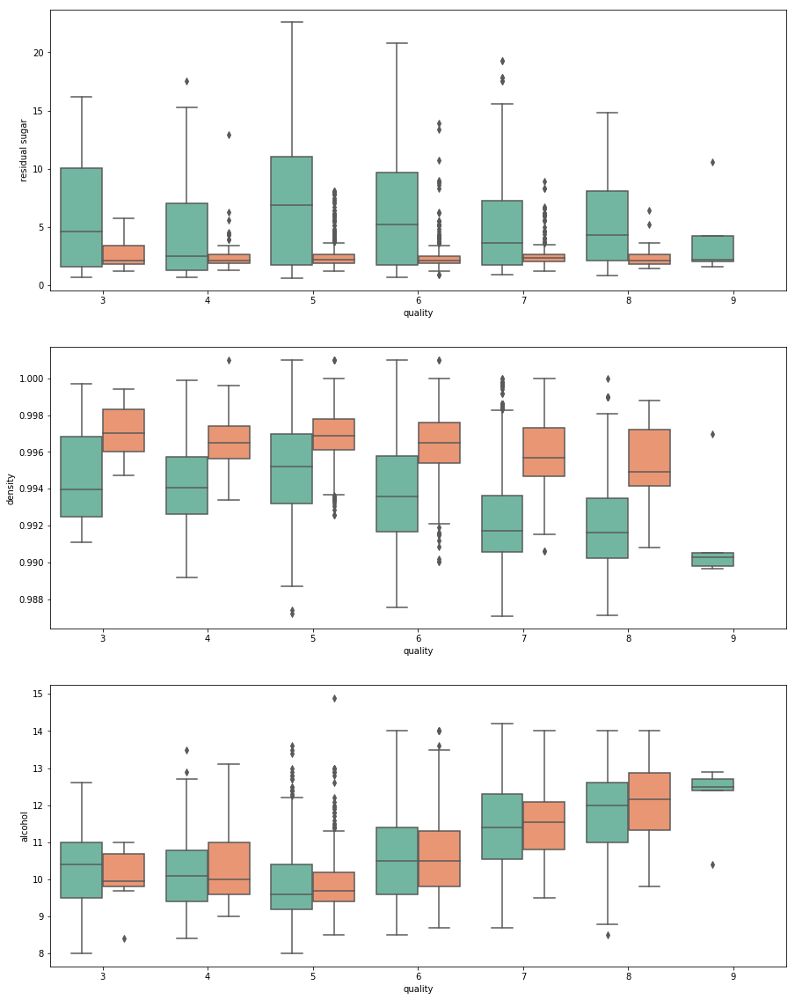

In [363]:
plot_box_plot_by_type(df,3,1,(15,20),['residual sugar','density','alcohol'],"quality_category")


**Análise do grupo relacionado à acidez (fixed acidity, volatile acidity , citric acid , pH )**

1) Fixed Acidity em vinhos tintos tem caráter crescente em relação à qualidade, e não se consegue identidicar esse mesmo caráter tão acentudado em relação ao vinho branco;

2) Volatile Acidity em vinhos tintos tem caráter decrescente em relação ao aumento qualidade, e não se consegue identidicar esse mesmo caráter em relação ao vinho branco;

3) Citric Acid tem caráter crescente em relação à qualidade nos vinhos tintos e ao aumento da qualidade, mas não tão acentuado quanto o crescimento de citric adcid em relação à qualidade em vinhos brancos;



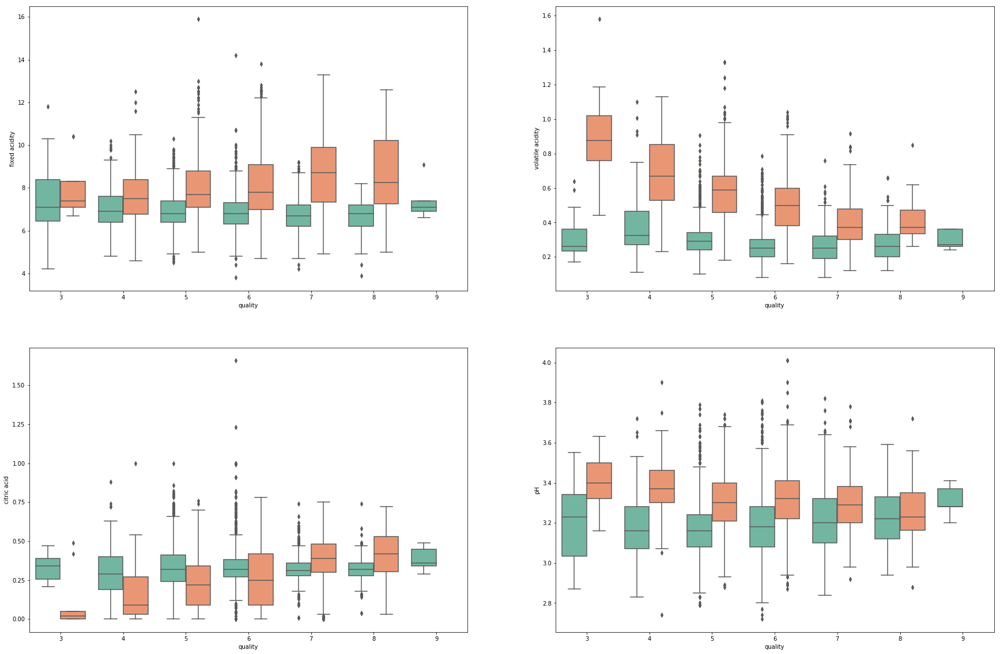

In [364]:
plot_box_plot_by_type(df,2,2,(30,20),['fixed acidity','volatile acidity','citric acid','pH'],"quality_category")


**Análise do grupo compostos químicos (chlorides, free sulfur dioxide , total sulfur dioxide , sulphates )**

1) Conseguimos perceber um padrão de crescimento em relação à qualidade dos Sulphates bem notório em relação aos vinhos tintos, e uma média quase constante em relação ao mesmo gráfico dos vinhos brancos;

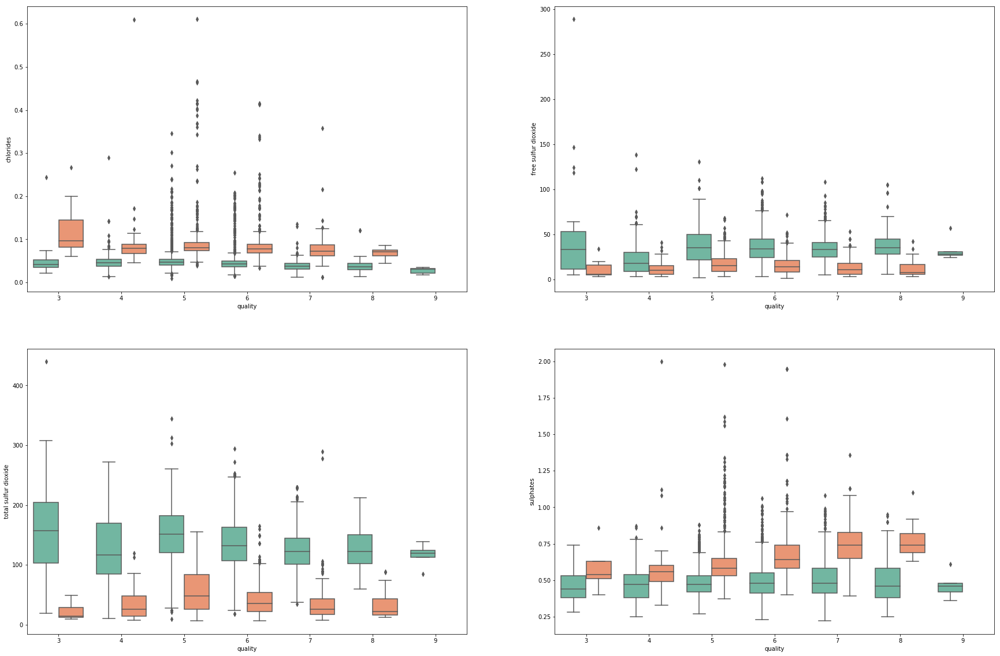

In [365]:
plot_box_plot_by_type(df,2,2,(30,20),['chlorides','free sulfur dioxide','total sulfur dioxide','sulphates'],"quality_category")

### Análise Feature by Feature

In [366]:
def print_regression_agregating_by_type(df,nrows,ncols,columns1,columns2,figsize):
  fig = plt.figure(figsize=figsize)
  plt.title("Análise de Regressão, agregando pelo tipo de vinho, tinto (Vermelho), branco (Azul)")
  element=1
  for index,column in enumerate(columns1):
    for index2, column2 in enumerate(columns2):      
        ax = fig.add_subplot(nrows,ncols,element)    
        sns.regplot(x = columns1[index], y=columns2[index2], color="red", data=df[df["type"]=="Red"],line_kws={'color': 'red'})
        sns.regplot(x = columns1[index], y=columns2[index2], data=df[df["type"]=="White"],line_kws={'color': 'blue'})
        element+=1
  
def print_regression(df,nrows,ncols,columns1,columns2,figsize):
  fig = plt.figure(figsize=figsize)
  plt.title("Análise de Regressão")
  element=1
  for index,column in enumerate(columns1):
    for index2, column2 in enumerate(columns2):      
        ax = fig.add_subplot(nrows,ncols,element)    
        sns.regplot(x = columns1[index], y=columns2[index2], data=df,line_kws={'color': 'blue'})
        element+=1

Por meio de um scatter plot, e destacando a linha de tendência, conseguimos analisar melhor as correlações entre as features (o que mostramos anteriormente no heatmap)

**Análise do grupo ácido (fixed acidity , volatile acidity , citric acid , pH)**

**1) Correlação positiva**

  **a)**   Volatile Acidity e Fixed Acidity

  **b)**   Citric Acid e Fixed Acid

  **c)**  pH e Volatile Acidity
      
 **2) Correlação negativa**
 
  **a)** pH e Fixed Acidity
  
  **b)** Citric Acid e Volatile Acidity
  
 **c)** Citric Acid e pH

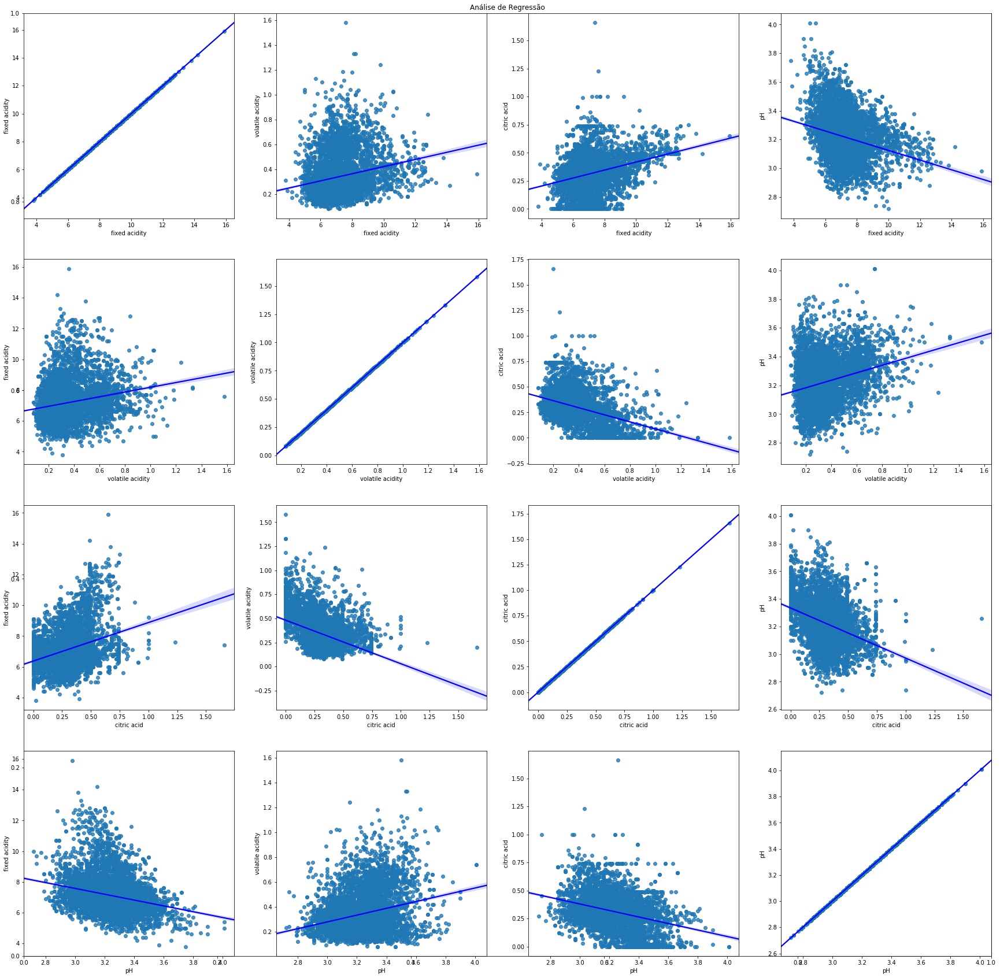

In [367]:
print_regression(df,4,4,acid_columns,acid_columns,(30,30))

**Análise do grupo ácido (fixed acidity , volatile acidity , citric acid , pH) agrupando pelo tipo de vinho**

Na grande maioria dos casos, a curva de crescimento e decrescimento nos vinhos tintos é mais acentuada que nos vinhos brancos.

Porém , algumas tendências que saltam aos olhos:

   **1)** Volatile Acidity e Fixed Acidity tem correlação negativa nos vinhso tintos e correção ligeiramente positiva nos vinhos brancos
    
   **2)** Volatile Acidity e pH tem correlação bem positiva em vinhos tintos e ligeiramente negativa nos vinhos brancos 

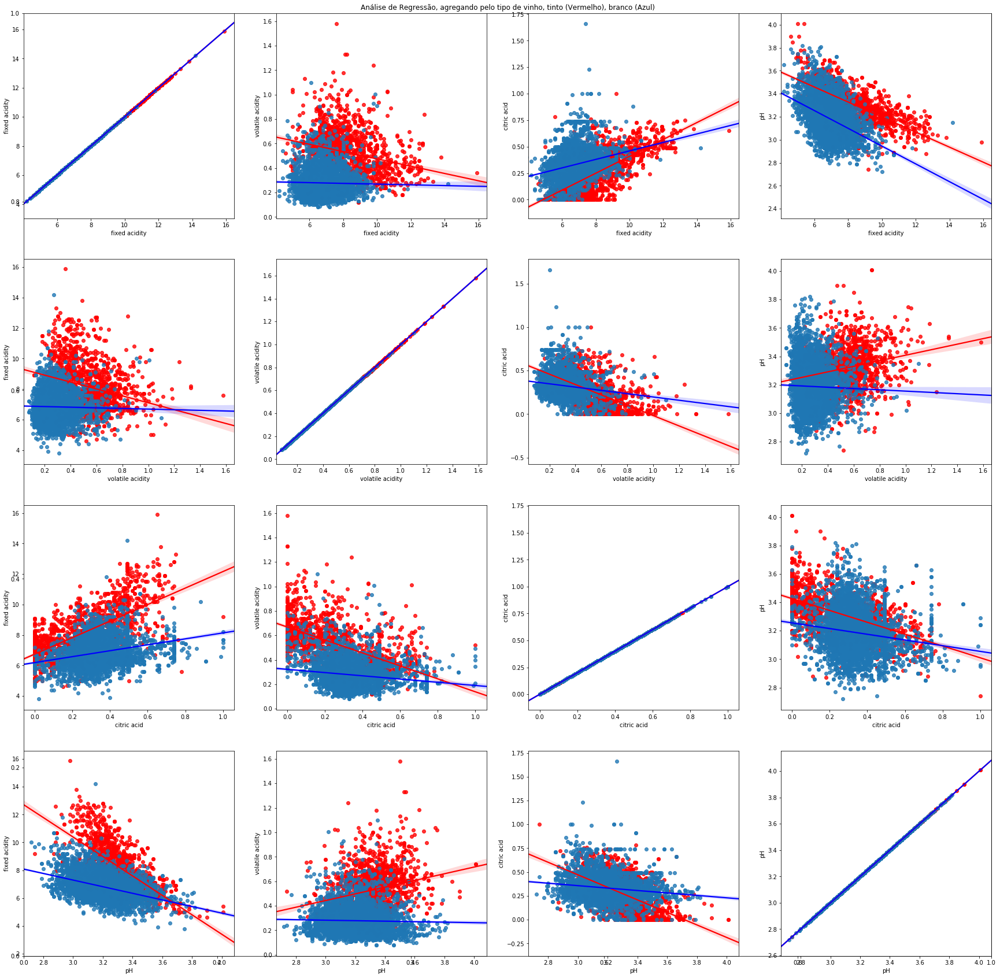

In [368]:
 print_regression_agregating_by_type(df,4,4,acid_columns,acid_columns,(30,30))

**Análise do Grupo Ácido (fixed acidity, volatile acidity, 'citric acid, pH) em relação ao Grupo de Outros Elementos ( chlorides, free sulfur dioxide, total sulfur dioxide, sulphates, alcohol)**

**1) Correlação Positiva**

**a)** Fixed Acidity e Chlorides

**b)** Fixed Acidity e Sulphates

**c)** Volatile Acid e Chlorides

**d)** Volatile Acid e Sulphates

**e)** Citric Acid e Total Sulfur Dioxide

**f)** pH e Sulphates

**g)** pH e Alcohol

**2) Correlação Negativa**

**a)** Fixed Acidity e Free Sulfur Dioxide

**b)** Fixed Acidity e Total Sulfur Dioxide

**c)** Fixed Acidity e Alcohol

**d)** Volatile Acidity e Free Sulfur Dioxide

**e)** Volatile Acidity e Total Sulfur Dioxide

**f)** Total Sulfur Dioxide e pH 



**Correlações mais notórias**

**1)** Total Sulfur Dioxide e Fixed Acidity (negativo)

**2)** Total Sulfur Dioxide e Volatile Acidity (negativo)

**3)** Total Sulfur Dioxide e Citic Acid (positiva)

  

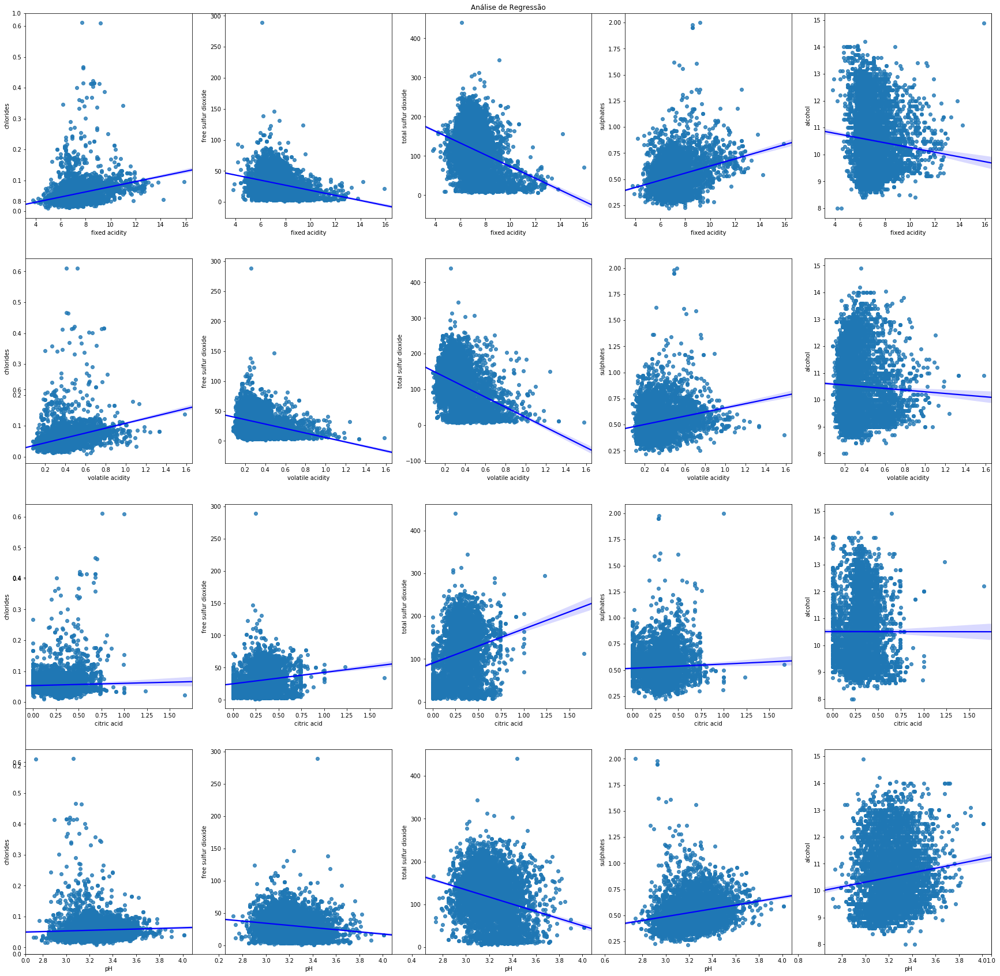

In [369]:
print_regression(df,len(acid_columns),len(elements_columns),acid_columns,elements_columns,(30,30))

**Análise do Grupo Ácido (fixed acidity, volatile acidity, citric acid, pH) em relação ao Grupo de Compostos Químicos ( chlorides, free sulfur dioxide, total sulfur dioxide, sulphates, alcohol) agrupados pelo Tipo de Vinho**


*   Há um comportamento diferente em relação a **fixed acidity e total sulfur dioxide**. Enquanto em vinhos tintos o comportamento é decrescente, a correlação é positiva para os vinhos brancos. Mesmo comportamento para as features **volatile acid e alcohol e pH e sulphates**

*   Há um comportamento diferente em relação a **fixed acidity e sulphates**. Enquanto em vinhos tintos o comportamento é crescente, a correlação é negativa para os vinhos brancos. Mesmo comportamento para  as features **volatile acidity e free sulfur dioxide, citric acid e alcohol**;







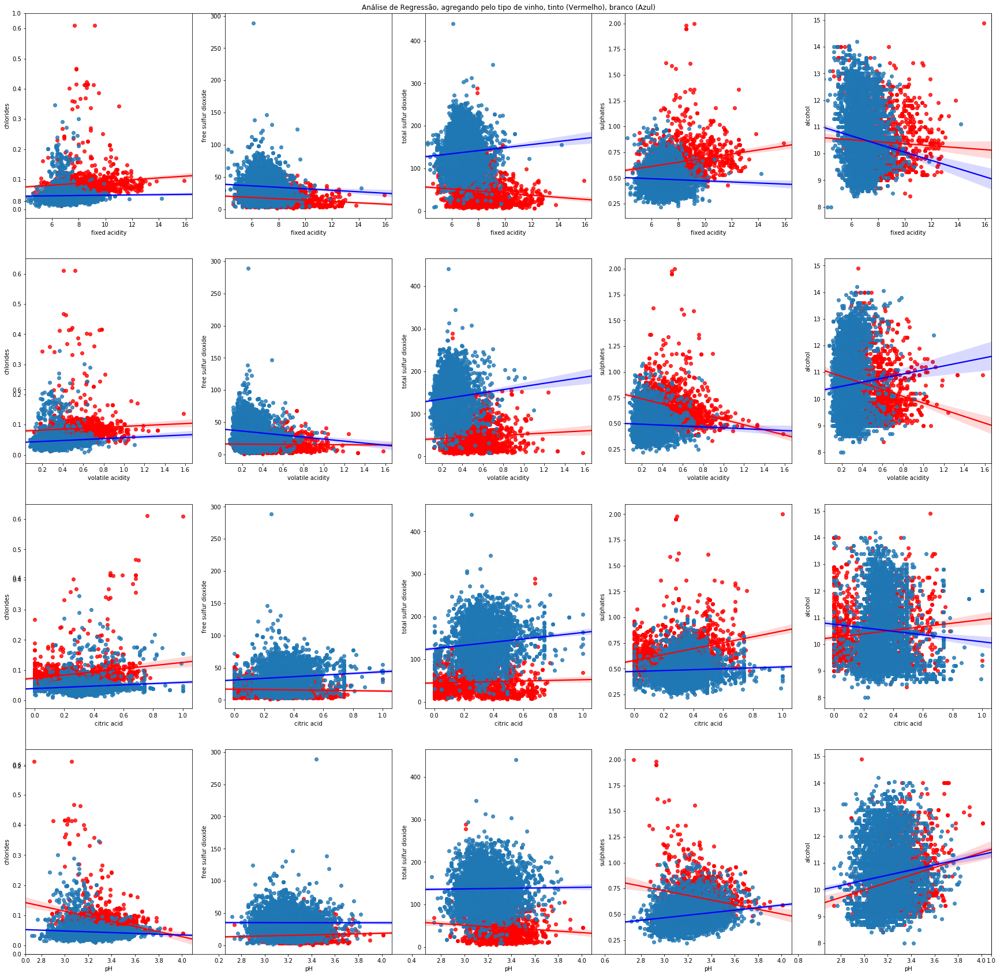

In [370]:
print_regression_agregating_by_type(df,len(acid_columns),len(elements_columns),acid_columns,elements_columns,(30,30))

**Análise do Grupo Ácido (fixed acidity, volatile acidity, citric acid, pH) em relação ao Grupo de Outros Elementos ( density e residual sugar)**

**Correlação positiva**


**a)** fixed acidity e density

**b)** volatile acidity e density

**c)** citric acid e  e residual sugar

**Correlação negativa**

**a)** fixed acidity e residual sugar

**b)** volatile acidity e residual sugar

**c)** pH e  e residual sugar

**Correlação mais notória**

**a)** Density e Fixed Acidity (positiva)




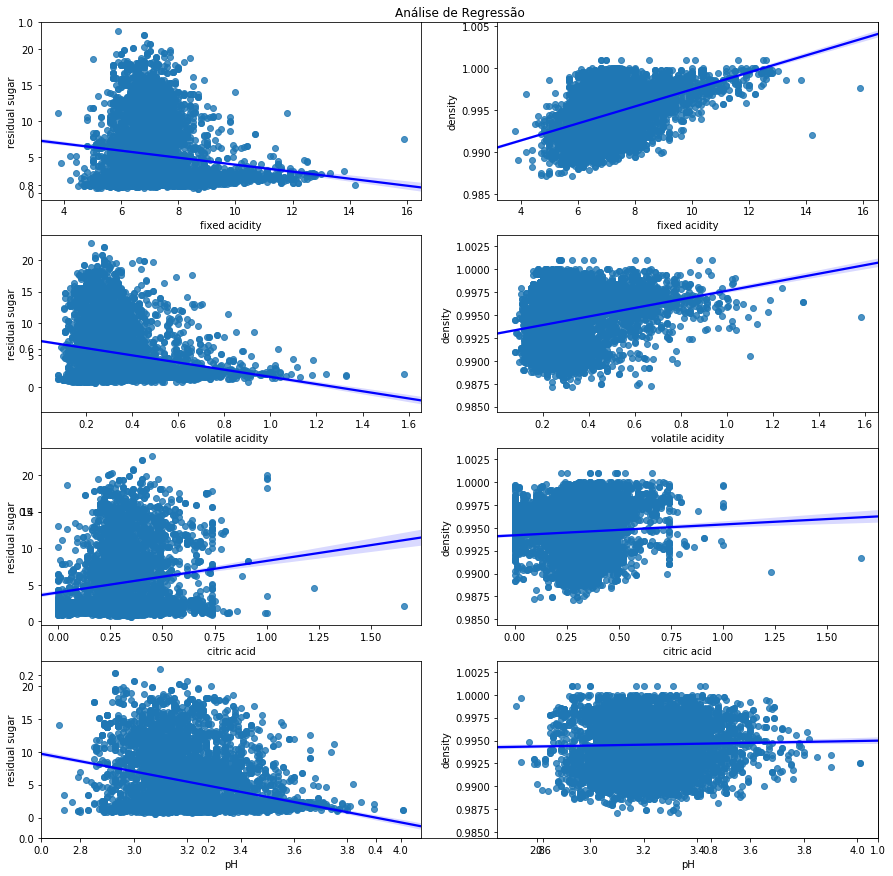

In [371]:
print_regression(df,len(acid_columns),len(other_columns),acid_columns,other_columns,(15,15))

**Análise do Grupo Ácido (fixed acidity, volatile acidity, citric acid, pH) em relação ao Grupo de Outros Elementos ( density e residual sugar) agrupados pelo tipo de Vinho**

Somente pH e residual sugar tem comportamento diferente para os vinhos tintos e brancos. Para os vinhos brancos, a correlação é marcadamente negativa

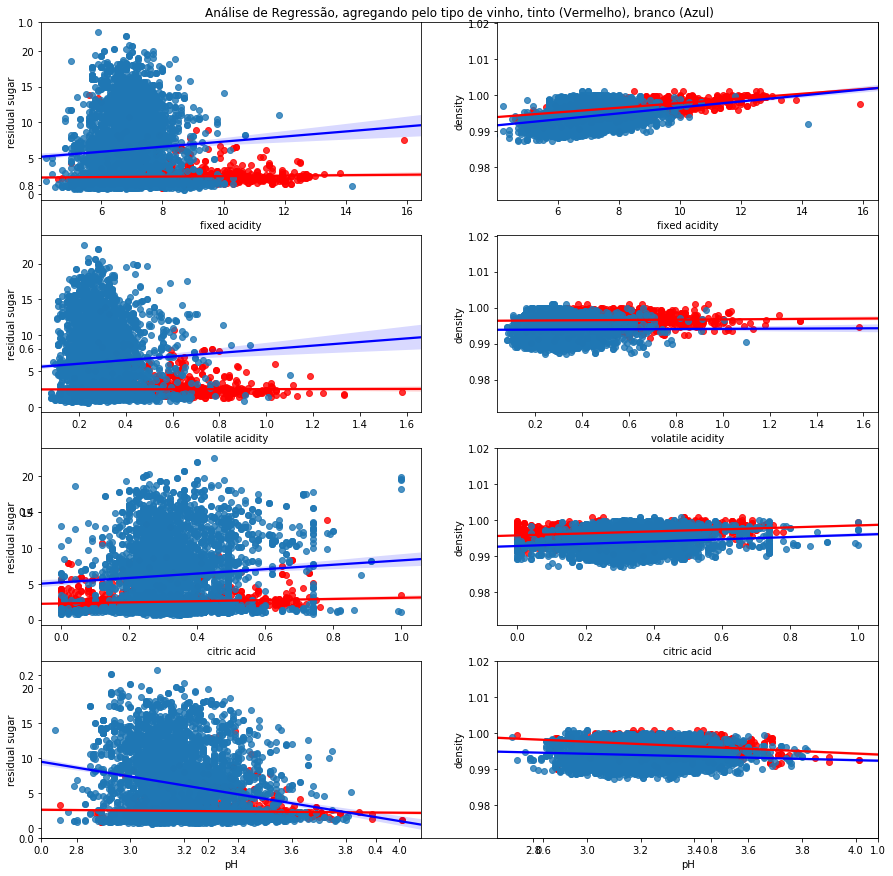

In [372]:
print_regression_agregating_by_type(df,len(acid_columns),len(other_columns),acid_columns,other_columns,(15,15))

**Análise do Grupo de Outros Elementos ( density e residual sugar)**

---



Há uma correlação crescente entre residual sugar e density

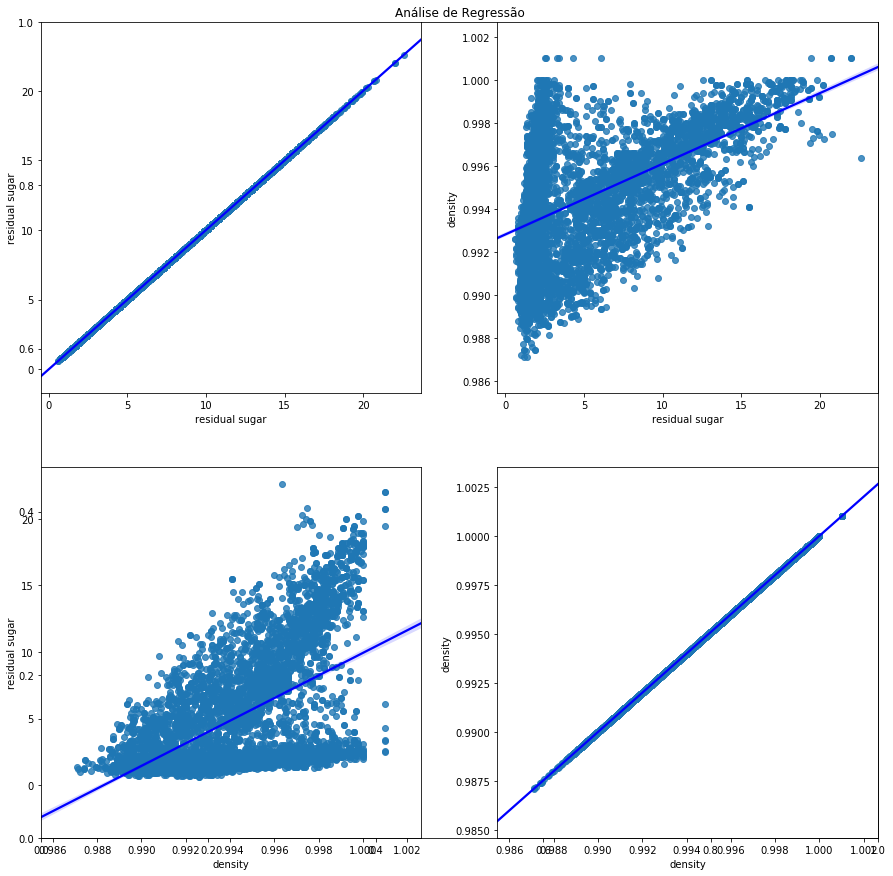

In [373]:
print_regression(df,len(other_columns),len(other_columns),other_columns,other_columns,(15,15))

**Análise do Grupo de Outros Elementos ( density e residual sugar) agrupados pelo tipo de vinho**


O comportamente é o mesmo nos vinhos tintos e brancos

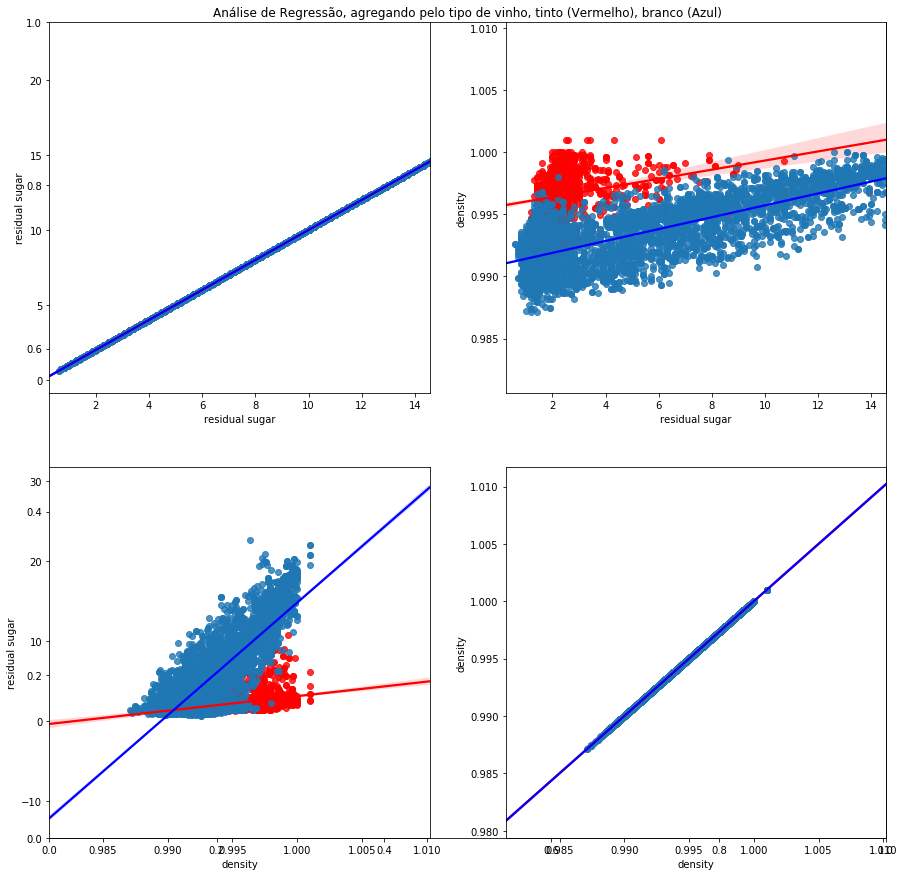

In [374]:
print_regression_agregating_by_type(df,len(other_columns),len(other_columns),other_columns,other_columns,(15,15))

**Análise do Grupo de Compostos Químicos ( chlorides, free sulfur dioxide, total sulfur dioxide, sulphates, alcohol) e, relação ao Grupo de Outros Elementos (Density e Residual Sugar)**

Correlação Positiva

**a)** Residual Sugar e Free Sulfur Dioxide

**b)** Residual Sigar e Total Sulfur Dioxide

**c)** Density e Sulphates

**d)** Density e Chlorides

Correlação Negativa

**a)** Residual Sugar e Alcohol

**b)** Alcohol e Density

Correlação mais notória

**a)** Residual Sugar e Total Sulfur Dioxide (positiva)

**b)** Alcohol e Density (negativa)

**c)** Alcohol e Residual Sugar (negativa)

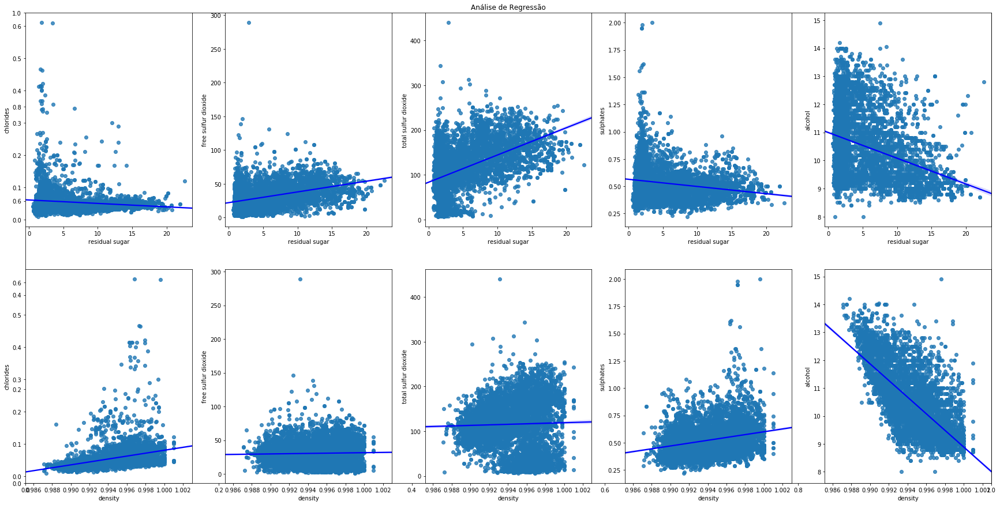

In [375]:
print_regression(df,len(other_columns),len(elements_columns),other_columns,elements_columns,(30,15))

**Análise do Grupo de Compostos Químicos ( chlorides, free sulfur dioxide, total sulfur dioxide, sulphates, alcohol) e, relação ao Grupo de Outros Elementos (Density e Residual Sugar) agrupados pelo tipo de vinho**

Há um comportamento diferente entre alcohol e residual sugar. Em vinhos tintos, quanto mais alcohol, mais residual sugar. Comportamente diferente para vinhos brancos.

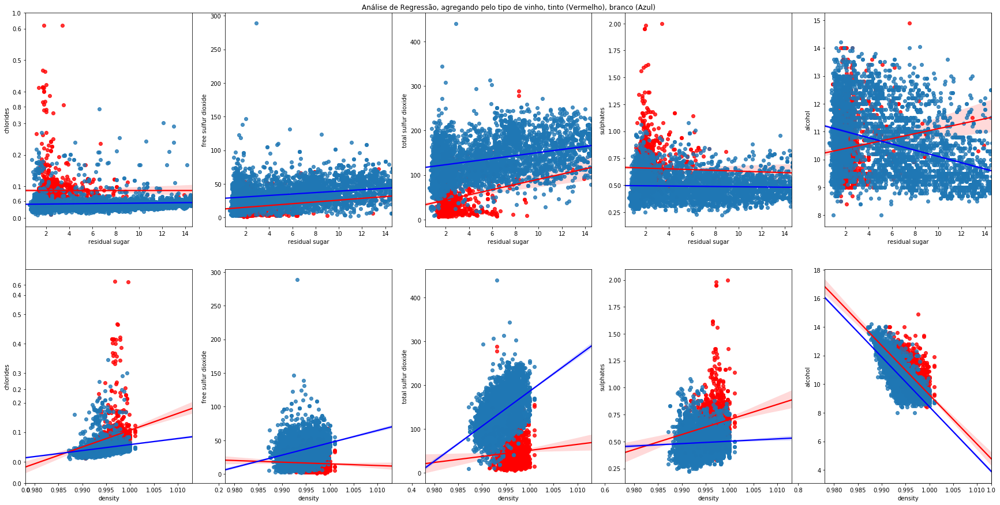

In [376]:
print_regression_agregating_by_type(df,len(other_columns),len(elements_columns),other_columns,elements_columns,(30,15))

### Análise de Variância (ANOVA)


Queremos avaliar se nos grupos que dividiremos a seguir , as features são todos parte de uma população maior ou populações distintas com características diferentes. Iremos avalirar em relação ao tipo de vinho e a qualidade de vinho.

* A Hipótese Nula é que não existe diferença entre as populações dos grupos que iremos dividir.
* A Hipótese Alternativa é que existe diferença

**1) Vinho Branco e Vinho Tinto (em relação ao tipo do vinho):**
   * A hipótese nula foi rejeitada com p-value = 0.05
   
**2) Vinho Ruim, Médio e Ótimo (em relação a qualidade do vinho):**
   * A hipótese nula foi rejeitada com p-value = 0.05


In [377]:
from scipy.stats import f_oneway

print("Análise nos vinhos tintos e brancos")
for column in columns_data:
  if column!="type":
    F, p = f_oneway(df_red[column],df_white[column])
    if(p>=0.05):
      print("Hipótese Nula Aceita. Estatística F:"+str(F)+" ; p-value:"+str(p))
    else:
      print("Hipótese Nula Rejeitada. Estatística F:"+str(F)+" ; p-value:"+str(p))
      
print("Análise nos vinhos pela qualidade") 
for column in columns_data:
  if column!="type":
    F, p = f_oneway(df_bad[column],df_medium[column],df_great[column])
    if(p>=0.05):
      print("Hipótese Nula Aceita. Estatística F:"+str(F)+" ; p-value:"+str(p))
    else:
      print("Hipótese Nula Rejeitada. Estatística F:"+str(F)+" ; p-value:"+str(p))
      





Análise nos vinhos tintos e brancos
Hipótese Nula Rejeitada. Estatística F:8.050857282518242 ; p-value:0.004562607828516177
Hipótese Nula Rejeitada. Estatística F:2192.0638119226624 ; p-value:0.0
Hipótese Nula Rejeitada. Estatística F:291.7471700828026 ; p-value:5.443713263649952e-64
Hipótese Nula Rejeitada. Estatística F:1216.8739132669882 ; p-value:4.124246735520393e-244
Hipótese Nula Rejeitada. Estatística F:1824.5170258782612 ; p-value:0.0
Hipótese Nula Rejeitada. Estatística F:1778.5397156854226 ; p-value:0.0
Hipótese Nula Rejeitada. Estatística F:833.7373422444276 ; p-value:2.2248332636292142e-172
Hipótese Nula Rejeitada. Estatística F:93.79076801462182 ; p-value:4.97551976902608e-22
Hipótese Nula Rejeitada. Estatística F:911.9742671899734 ; p-value:2.463950053017916e-187
Hipótese Nula Rejeitada. Estatística F:1951.0282051686684 ; p-value:0.0
Hipótese Nula Rejeitada. Estatística F:6043.507503896272 ; p-value:0.0
Hipótese Nula Rejeitada. Estatística F:4731.672286549565 ; p-value:0

## Análise Multivariada



**Para uma melhor visualização, resolvemos utilzar a qualidade do vinho somente em relação a ele ser Bom, Médio ou Ótimo**

Foi feita uma análise combinando os conjuntos que separamos de features (features com respeito a acidez, compostos químicos, outros elementos). Porém, não conseguimos identifar nada de relevante.  As visualizações a seguir diz respeito a essas combinações de feature, agregando pela qualidade. Em seguida, **foi feita uma análise dos vinhos ruins com os vinhos bons, e algumas carascterísticas puderam ser notadas.**



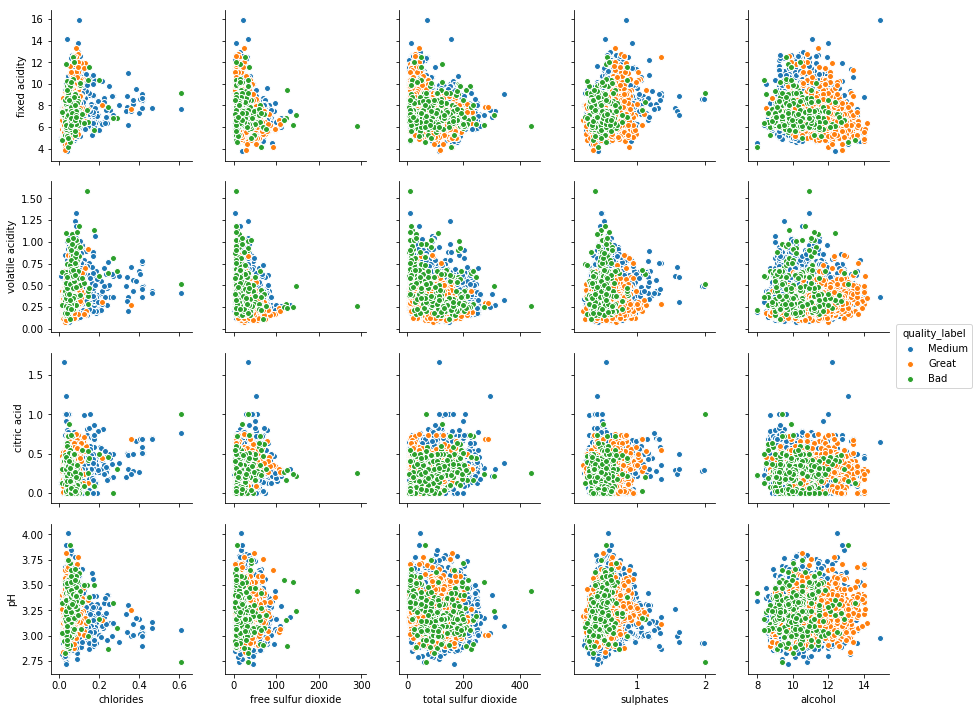

In [378]:
sns.pairplot(df,hue = 'quality_label',x_vars = elements_columns,y_vars = acid_columns)

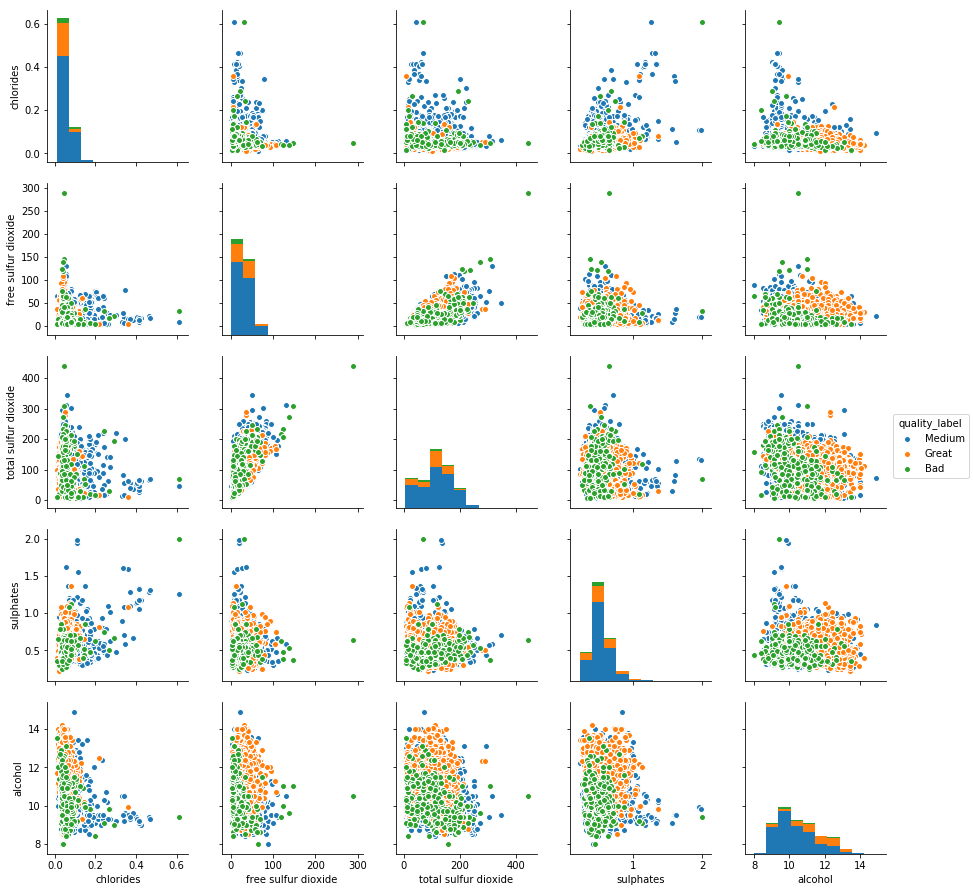

In [379]:
sns.pairplot(df,hue = 'quality_label',x_vars = elements_columns,y_vars = elements_columns)

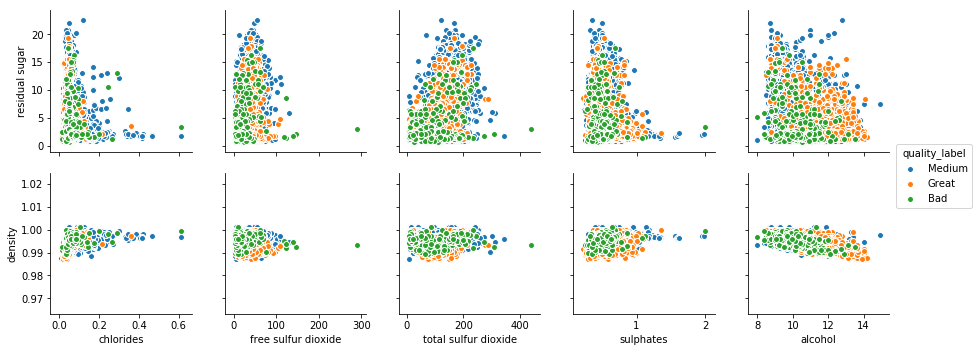

In [380]:
sns.pairplot(df,hue = 'quality_label',x_vars = elements_columns,y_vars = other_columns)

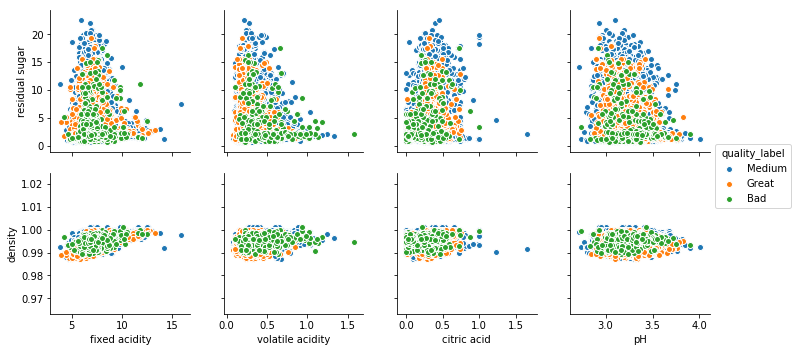

In [381]:
sns.pairplot(df,hue = 'quality_label',x_vars = acid_columns,y_vars = other_columns)

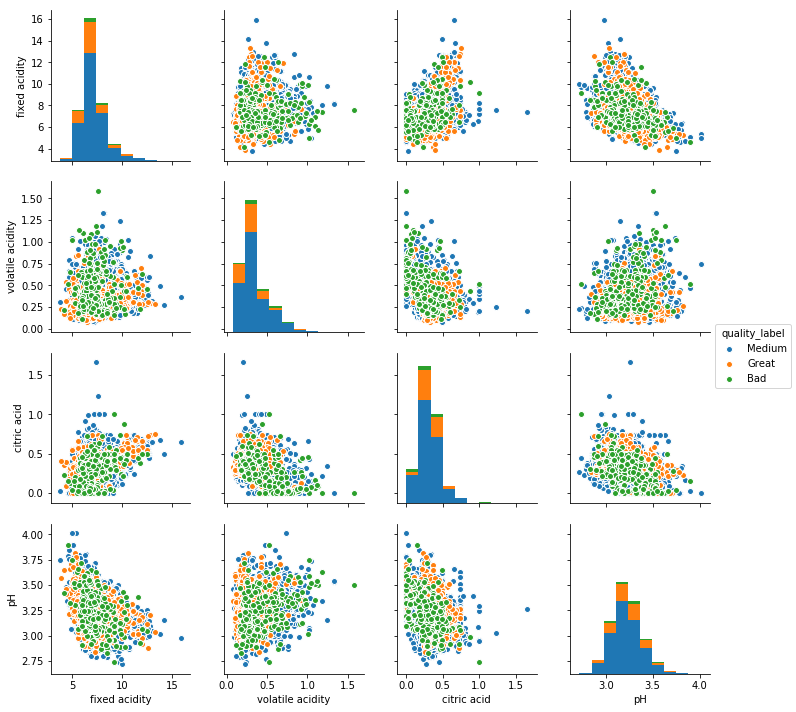

In [382]:
sns.pairplot(df,hue = 'quality_label',x_vars = acid_columns,y_vars = acid_columns)

**Análise dos vinhos ótimos com os vinhos ruins**

* É notório que em relação ao alcohol e sulphates, os vinhos ruins estão concentrados nas áreas inferiores à esquerda (menor valor de álcohol e concentração de sulphates), e os vinhos bons para maiores valores de alcohol e sulphate.

* É notório que em relação a densidade e alcohol, os vinhos ruins estão concentrados na área de maior densidade e menor concetração alcólica. 

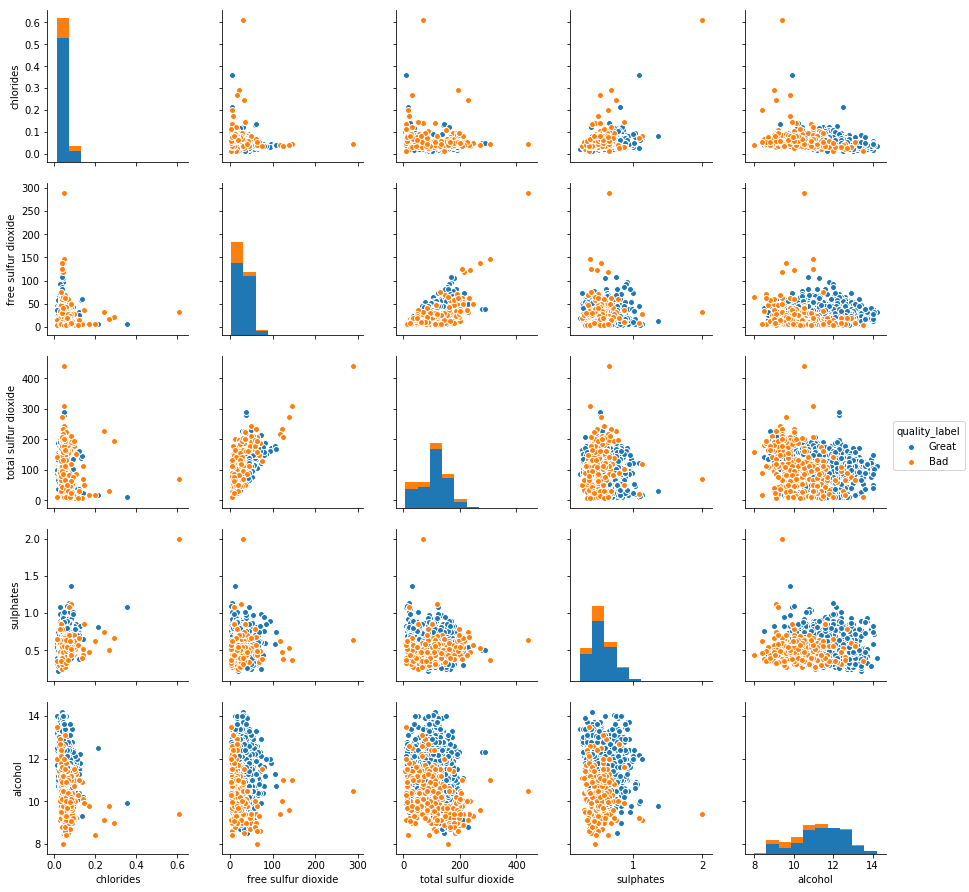

In [383]:
sns.pairplot(df[(df["quality_category"] == 0) | (df["quality_category"] == 2)],hue = 'quality_label',x_vars = elements_columns,y_vars = elements_columns)

**Podemos perceber melhor essa correlação, plotando em um gráfico maior a relação da feature alcohol com sulphates, em vinhos ruins e bons.**

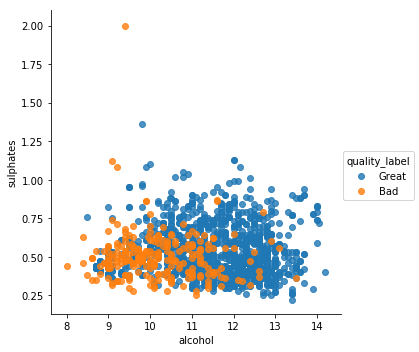

In [385]:
data = df[(df["quality_category"] == 0) | (df["quality_category"] == 2)]

sns.lmplot(x="alcohol", y="sulphates",  hue='quality_label', data=data,fit_reg=False)

**Podemos perceber uma divisão bem clara entre alcohol e density, para vinhos de qualidade ruim e ótima**

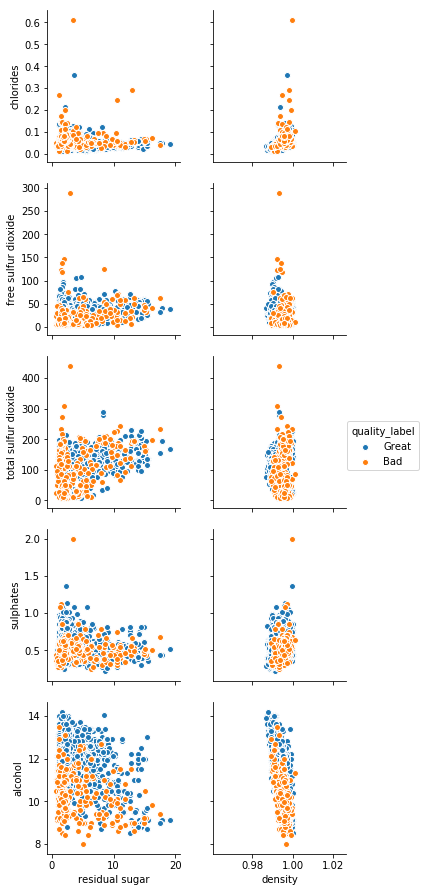

In [386]:
sns.pairplot(df[(df["quality_category"] == 0) | (df["quality_category"] == 2)],hue = 'quality_label',x_vars = other_columns,y_vars = elements_columns)

**Visualizando melhor o scatterplot:**

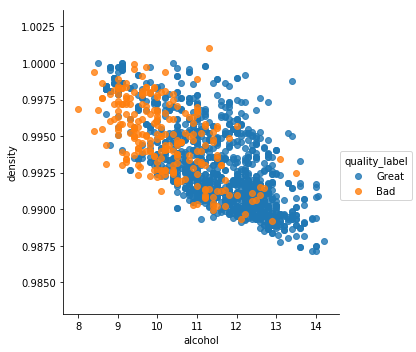

In [388]:
data = df[(df["quality_category"] == 0) | (df["quality_category"] == 2)]

sns.lmplot(x="alcohol", y="density",  hue='quality_label', data=data,fit_reg=False)

# Modelagem 

In [389]:
from sklearn import model_selection

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
import itertools
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import precision_recall_fscore_support
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.decomposition import PCA

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB




In [390]:
def normalize(v):
    norm=np.linalg.norm(v, ord=1)
    if norm==0:
        norm=np.finfo(v.dtype).eps
    return v/norm

**Vamos normalizar os valores pela média e desvio padrão**

In [391]:
def prepare_data(df,drop_columns = ["quality_category","quality_label"]):
  x = df.drop(drop_columns,axis=1)
  x["type"] = x["type"].map(lambda x: {"White":0,"Red":1}[x]).astype(int)
  for column in x.columns:
    if column!="quality" and column!="type" and column!="quality_label" and column!="quality_category":
      x[column]=(x[column]-(x[column].mean()))/(x[column].std())
  return x
  

* Vamos reservar 1/3 dos valores para teste.
* Vamos separar treino e teste de maneira estratificada, mantendo a proporção das classes
* Utilizaremos a opção StratifiedKKold para fazer validação cruzada utilizando somente 3 folds , porque mais do que isso, as classes minoritárias ficarâo praticamente zeradas nos folds



**Em todos os modelos, utilizaremos o GridSearch para achar os melhores parâmetros.**

In [392]:
df2 = prepare_data(df)
x = df2.loc[:,list(set(df2.columns)-set(["quality"]))].values
y= df2.loc[:,"quality"].values
            
cv = model_selection.StratifiedKFold(n_splits=3)

X_traincv, X_testcv, y_traincv, y_testcv = model_selection.train_test_split(x,
                                                                            y,
                                                                            test_size=0.33,
                                                                            random_state=4,
                                                                            stratify=y)


In [393]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    

def class_report(y_true, y_pred, y_score=None, average='micro'):
    if y_true.shape != y_pred.shape:
        print("Error! y_true %s is not the same shape as y_pred %s" % (
              y_true.shape,
              y_pred.shape)
        )
        return

    lb = LabelBinarizer()

    if len(y_true.shape) == 1:
        lb.fit(y_true)

    #Value counts of predictions
    labels, cnt = np.unique(
        y_true,
        return_counts=True)
    n_classes = len(labels)
    pred_cnt = pd.Series(cnt, index=labels)

    metrics_summary = precision_recall_fscore_support(
            y_true=y_true,
            y_pred=y_pred,
            labels=labels)

    avg = list(precision_recall_fscore_support(
            y_true=y_true, 
            y_pred=y_pred,
            average='weighted'))

    metrics_sum_index = ['precision', 'recall', 'f1-score', 'support']
    class_report_df = pd.DataFrame(
        list(metrics_summary),
        index=metrics_sum_index,
        columns=labels)

    support = class_report_df.loc['support']
    total = support.sum() 
    class_report_df['avg / total'] = avg[:-1] + [total]

    class_report_df = class_report_df.T
    class_report_df['pred'] = pred_cnt
    class_report_df['pred'].iloc[-1] = total

    if not (y_score is None):
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for label_it, label in enumerate(labels):
            fpr[label], tpr[label], _ = roc_curve(
                (y_true == label).astype(int), 
                y_score[:, label_it])

            roc_auc[label] = auc(fpr[label], tpr[label])

        if average == 'micro':
            if n_classes <= 2:
                fpr["avg / total"], tpr["avg / total"], _ = roc_curve(
                    lb.transform(y_true).ravel(), 
                    y_score[:, 1].ravel())
            else:
                fpr["avg / total"], tpr["avg / total"], _ = roc_curve(
                        lb.transform(y_true).ravel(), 
                        y_score.ravel())

            roc_auc["avg / total"] = auc(
                fpr["avg / total"], 
                tpr["avg / total"])

        elif average == 'macro':
            # First aggregate all false positive rates
            all_fpr = np.unique(np.concatenate([
                fpr[i] for i in labels]
            ))

            # Then interpolate all ROC curves at this points
            mean_tpr = np.zeros_like(all_fpr)
            for i in labels:
                mean_tpr += interp(all_fpr, fpr[i], tpr[i])

            # Finally average it and compute AUC
            mean_tpr /= n_classes

            fpr["macro"] = all_fpr
            tpr["macro"] = mean_tpr

            roc_auc["avg / total"] = auc(fpr["macro"], tpr["macro"])

        class_report_df['AUC'] = pd.Series(roc_auc)
    return class_report_df    

In [394]:
def plot_learning_curve(estimator, 
                        title, 
                        X, 
                        y, 
                        ylim=None, 
                        cv=None,
                        n_jobs=-1, 
                        train_sizes=np.linspace(.1, 1.0, 5)):
    
    plt.figure(figsize=(16,8))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = model_selection.learning_curve(estimator, 
                                                            X, y, cv=cv, 
                                                            n_jobs=n_jobs, 
                                                            train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    return plt

In [397]:
def model_fit_transform_and_eval(model,params,cv, x_train, y_train, x_test, y_test):
   grid = GridSearchCV(model,params, scoring = 'accuracy', cv=cv,n_jobs=-1).fit(x_train,y_train)
   best_model = grid.best_estimator_
   y_pred = best_model.predict(x_test)
   best_model_confuncion_matrix = confusion_matrix(y_test, y_pred)   
   best_model_report = class_report(y_test, y_pred)
   return {"best_model":best_model,"confusion_matrix":best_model_confuncion_matrix,"model_report":best_model_report, "best_params":grid.best_params_}

## Regressão Logística , utilizando o algoritmo One vs The Rest

Utilizaremos o GridSearch para selecionar:
* Melhor tip de regularização (l1 ou l2)
* Melhor penalização de overfitting
* Se utilizaremos ou não classes balanceadas (penalizar ou não classes com maior número de elementos)

In [398]:
Cs = np.linspace(0.1,100,40)
param_grid=dict(estimator__C=Cs, estimator__penalty=["l1","l2"],estimator__class_weight=["balanced",None])
model = OneVsRestClassifier(LogisticRegression())
clf_logistic_regression = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


**Os melhores parâmetros para o melhor estimador**

In [399]:
clf_logistic_regression["best_params"]

{'estimator__C': 82.06923076923077,
 'estimator__class_weight': None,
 'estimator__penalty': 'l1'}

**Plotando a curva de aprendizado para o melhor estimador**

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

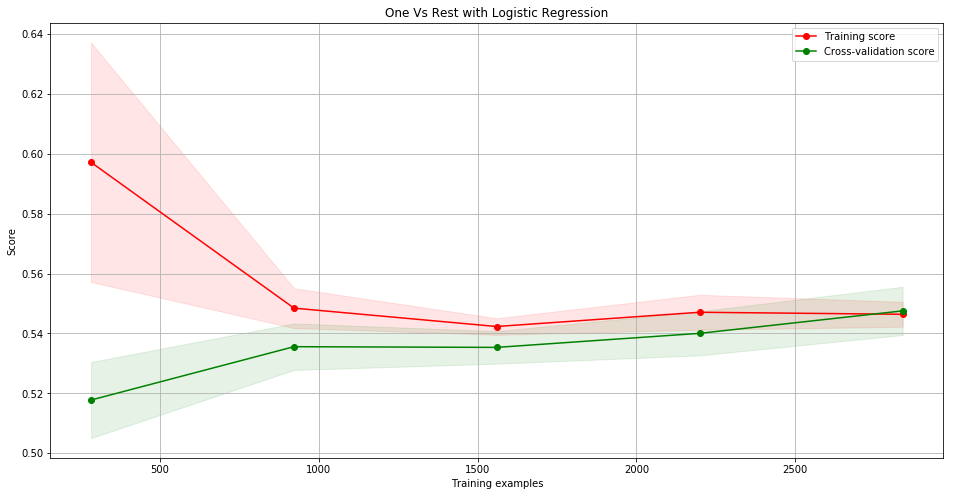

In [400]:
plot_learning_curve(clf_logistic_regression["best_model"], 
                        "One Vs Rest with Logistic Regression", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

A tabela abaixo indica os valores das métricas utilizadas para avaliar os estimadores.

* **O modelo teve uma precisão geral de 53%**

* **O modelo acerta 58% dos vinhos de qualidade 5, 51% dos vinhos de qualidade 6, 49% dos vinhos de qualidade 7 e 100% ds vinhos de qualidade 4**

* **O modelo falha completamente em relação aos vinhos de qualidade 3,8 e 9**




In [401]:
clf_logistic_regression["model_report"]

,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,1.000000,0.014085,0.027778,71.0,71.0
5,0.582763,0.621898,0.601695,685.0,685.0
6,0.511468,0.727965,0.600808,919.0,919.0
7,0.491525,0.082621,0.141463,351.0,351.0
8,0.000000,0.000000,0.000000,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.529884,0.535714,0.483776,2100.0,2100.0


[[  0   0   5   3   0   1   0]
 [  0   1  41  28   1   0   0]
 [  0   0 426 258   1   0   0]
 [  0   0 235 669  15   0   0]
 [  0   0  15 307  29   0   0]
 [  0   0   9  43  11   0   0]
 [  0   0   0   0   2   0   0]]


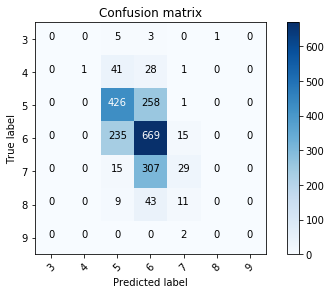

In [402]:
plot_confusion_matrix(clf_logistic_regression["confusion_matrix"], ["3","4","5","6","7","8","9"])

**O algoritmo one vs the rest, junto com regressão logística, produz n_classes algoritmos de regressão logística. Um algoritmo para cada classe. Sendo assim, podemos plotar a importância das features de cada algoritmo de cada classe. O que significa que saberemos feature foi mais importante para o algoritmo prever aquela classe**. 

* O tipo de vinho foi a feature mais importante para a predição do vinho de Qualidade 3 e 4

* Density tem efeitos completamentes diferentes para os vinhos de categoria 6,7 , e são as features mais importantes (em módulo)

* Citric Acid foi uma das features que obteve menos importância em todos os 7 estimadores

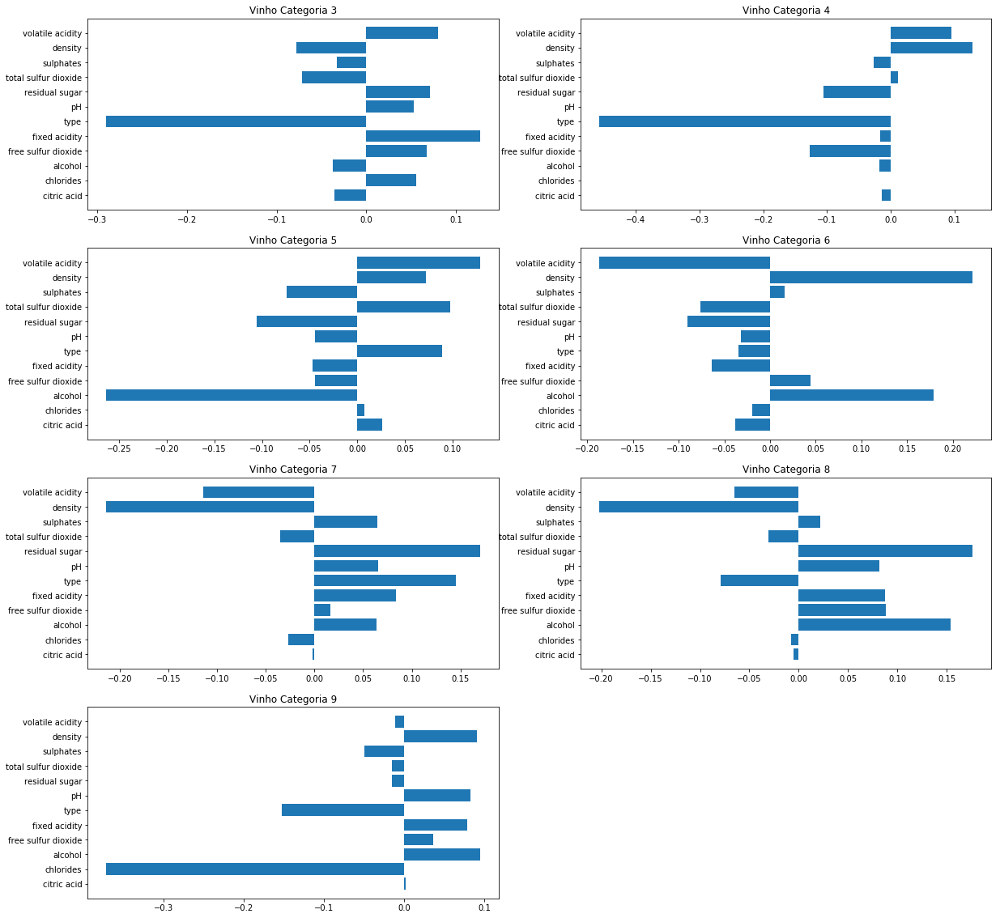

In [403]:
columns_data = list(set(columns_data)-set(["quality"]))
lower,upper = -1,1
fig = plt.figure(figsize=(20,20))
for index in range(7):
  logistic_regression_feature_importance = normalize(clf_logistic_regression["best_model"].estimators_[index].coef_[0])
  ax = fig.add_subplot(4,2,index+1)
  ax.barh(columns_data, logistic_regression_feature_importance , align='center')
  ax.set_title("Vinho Categoria "+str(index+3))


## Random Forest

Utilizaremos o GridSearch para selecionar:
* Se utilizaremos ou não classes balanceadas
*  Número de árvores a serem utilizadas na Random Forest (n_estimators)
*  Para selecionar o número máximo de features a serem procurados na hora do split (max_features [auto ou sqrt do número total de features])
* A máxima profundidade de cada árvore no algortimo (max_depth)
* Número mínimo nas amostras necessários para se dividir um nó interno de uma árvore (min_samples_split)
* Número mínimo nas amostras necessários de uma folha (min_samples_leaf)




In [404]:
model = RandomForestClassifier()
param_grid = {"class_weight":["balanced",None],'bootstrap': [True, False],
 'max_depth': [10, 20, 30, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [400, 600, 800]}

clf_random_forest = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)


/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [405]:
clf_random_forest["best_params"]

{'bootstrap': True,
 'class_weight': 'balanced',
 'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 400}

**Plotando a curva de aprendizado para o melhor estimador**

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

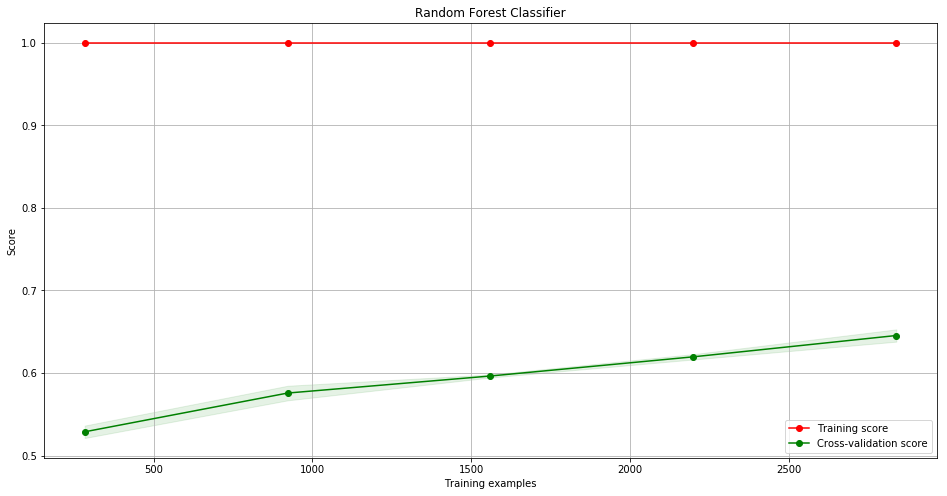

In [406]:
plot_learning_curve(clf_random_forest["best_model"], 
                        "Random Forest Classifier", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

A tabela abaixo indica os valores das métricas utilizadas para avaliar os estimadores.

* Random Forest obteve **68.45%** de acuracidade;
* Obteve 100% de Precision para os vinho de qualidade 4;
* Para os vinhos de qualidade 3 e 9, o modelo preveu erroneamente todos os casos;


In [407]:
clf_random_forest["model_report"]

,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,1.000000,0.084507,0.155844,71.0,71.0
5,0.693481,0.729927,0.711238,685.0,685.0
6,0.626866,0.776931,0.693878,919.0,919.0
7,0.731707,0.427350,0.539568,351.0,351.0
8,0.928571,0.412698,0.571429,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.684502,0.664762,0.648250,2100.0,2100.0


[[  0   0   6   3   0   0   0]
 [  1   6  38  24   2   0   0]
 [  0   0 500 182   3   0   0]
 [  0   0 167 714  37   1   0]
 [  0   0  10 190 150   1   0]
 [  0   0   0  25  12  26   0]
 [  0   0   0   1   1   0   0]]


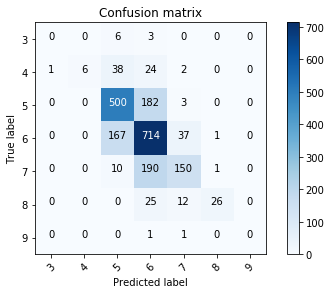

In [408]:
plot_confusion_matrix(clf_random_forest["confusion_matrix"], ["3","4","5","6","7","8","9"])

In [409]:
random_forest_feature_importance = clf_random_forest["best_model"].feature_importances_
random_forest_feature_importance = normalize(random_forest_feature_importance)

O gráfico abaixo mostra a importância das features, n algoritmo de Random Forest. As três features mais importantes são:
    
**1)** Alcohol

**2)** Density

**3)** Volatile Acidity

Text(0.5,1,'Random Forest - Feature Importance')

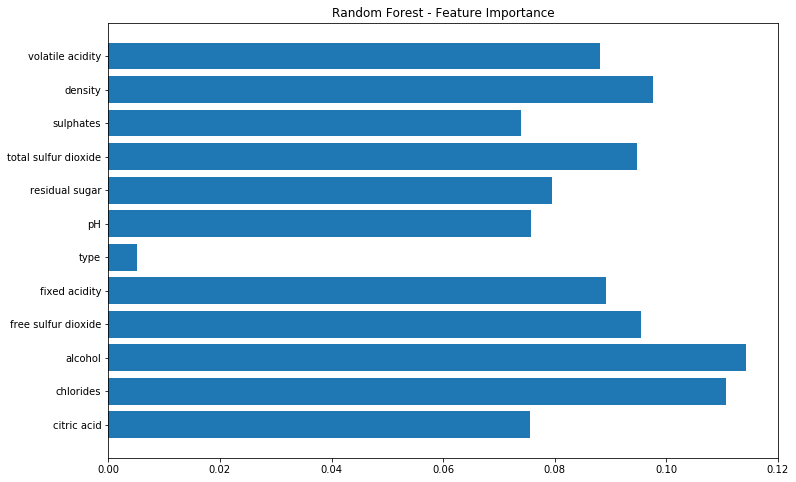

In [410]:
fig = plt.figure(figsize=(12,8))
plt.barh(['citric acid', 'chlorides', 'alcohol', 'free sulfur dioxide', 'fixed acidity','type','pH','residual sugar','total sulfur dioxide','sulphates','density','volatile acidity'], random_forest_feature_importance , align='center')
plt.title('Random Forest - Feature Importance')


### Árvore de Decisão

Utilizaremos o GridSearch para selecionar:

* Se utilizaremos ou não classes balanceadas
* Para selecionar o número máximo de features a serem procurados na hora do split (max_features [auto ou sqrt do número total de features])
* A máxima profundidade de cada árvore no algortimo (max_depth)
* Número mínimo nas amostras necessários para se dividir um nó interno de uma árvore (min_samples_split)
* Número mínimo nas amostras necessários de uma folha (min_samples_leaf)

In [411]:
model = DecisionTreeClassifier()
param_grid = {"class_weight":["balanced",None],
 'max_depth': range(1,40),
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1,2,3,4],
 'min_samples_split': [2, 5, 10]
}

clf_decision_tree = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)

**Plotando a curva de aprendizagem**

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

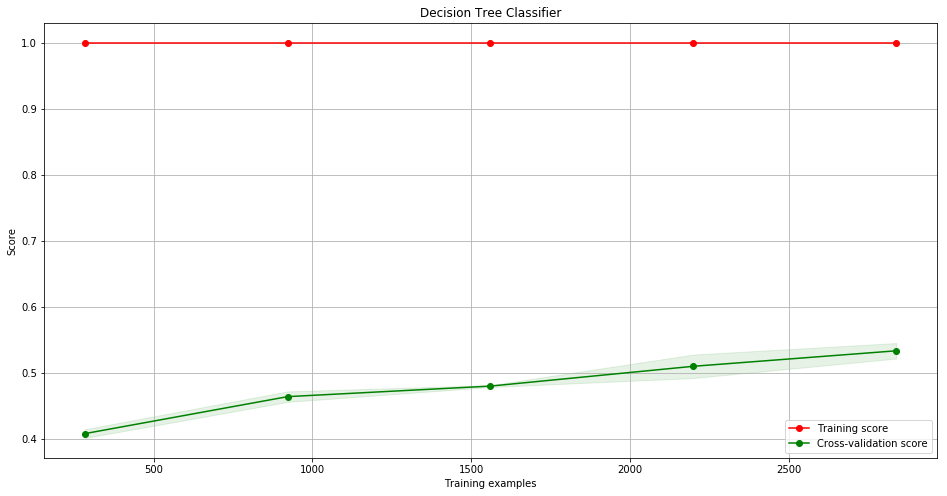

In [412]:
plot_learning_curve(clf_decision_tree["best_model"], 
                        "Decision Tree Classifier", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

A tabela abaixo indica os valores das métricas utilizadas para avaliar os estimadores.

* O algoritmo de árvore de decisão obteve 58.2% de precisão;

* O algoritmo não teve acertividade nos vinhos de qualidade 3 e 9;

* O algoritmo teve uma precisão maior para os vinhos de qualidade 5 e 6.

In [413]:
clf_decision_tree["model_report"]

,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,0.203390,0.169014,0.184615,71.0,71.0
5,0.600543,0.645255,0.622097,685.0,685.0
6,0.626832,0.605005,0.615725,919.0,919.0
7,0.525000,0.478632,0.500745,351.0,351.0
8,0.402439,0.523810,0.455172,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.576905,0.576667,0.575968,2100.0,2100.0


In [414]:
clf_decision_tree["model_report"]["precision"].loc["avg / total"]

0.5769048779469568

[[  0   0   4   3   2   0   0]
 [  1  12  33  19   6   0   0]
 [  6  27 442 179  24   6   1]
 [  7  18 210 556 110  18   0]
 [  1   1  41 115 168  25   0]
 [  0   1   6  14   9  33   0]
 [  0   0   0   1   1   0   0]]


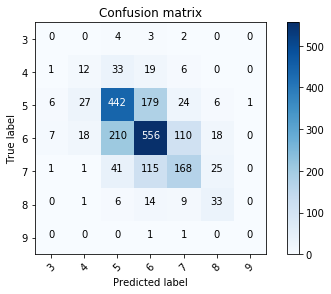

In [415]:
plot_confusion_matrix(clf_decision_tree["confusion_matrix"], ["3","4","5","6","7","8","9"])

## K - Nearest Neighbor

Utilizamos o algoritmo K - Nearest Neighbor. Por meio do GridSearch, selecionamos os pelos parâmetros:
* Métricas de Distância
* Pesos
* Número de vizinhos

In [416]:
metrics       = ['minkowski','euclidean','manhattan'] 
weights       = ['uniform','distance']
numNeighbors  = np.arange(5,12)
model = KNeighborsClassifier()
param_grid    = dict(metric=metrics,weights=weights,n_neighbors=numNeighbors)

clf_knn = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [417]:
clf_knn["best_params"]

{'metric': 'minkowski', 'n_neighbors': 10, 'weights': 'distance'}

**Plotando a melhor curva**

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

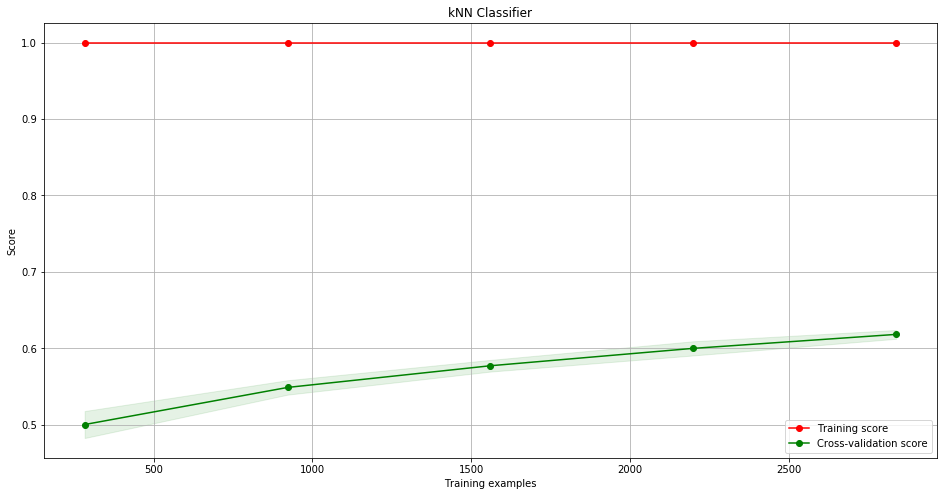

In [418]:
plot_learning_curve(clf_knn["best_model"], 
                        "kNN Classifier", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

O algoritmo obteve **64.8%** de precisão. 
* Houve 100% de erro para os vinhos de qualidade 3 e 9;
* 100% de acerto para os vinhos de qualidade 4;


In [419]:
clf_knn["model_report"]


,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,1.000000,0.112676,0.202532,71.0,71.0
5,0.672365,0.689051,0.680606,685.0,685.0
6,0.614218,0.705114,0.656535,919.0,919.0
7,0.607261,0.524217,0.562691,351.0,351.0
8,0.812500,0.412698,0.547368,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.647796,0.637143,0.626638,2100.0,2100.0


[[  0   0   6   2   1   0   0]
 [  0   8  29  32   2   0   0]
 [  0   0 472 199  14   0   0]
 [  0   0 185 648  82   4   0]
 [  0   0   8 157 184   2   0]
 [  0   0   2  16  19  26   0]
 [  0   0   0   1   1   0   0]]


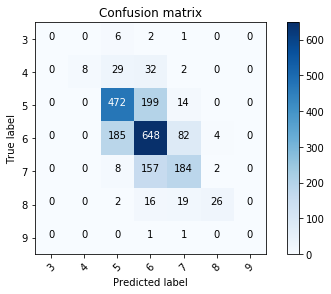

In [420]:
plot_confusion_matrix(clf_knn["confusion_matrix"], ["3","4","5","6","7","8","9"])

### SVM 

In [421]:
model = LinearSVC(multi_class='ovr')

Cs = np.linspace(0.1,100,200)
gammas = np.logspace(-5, 0, 10)

param_grid=dict(C=Cs, class_weight=["balanced",None])

clf_svm = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [422]:
clf_svm["best_params"]

{'C': 5.120100502512563, 'class_weight': None}

**Plotando a curva de aprendizagem:**

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

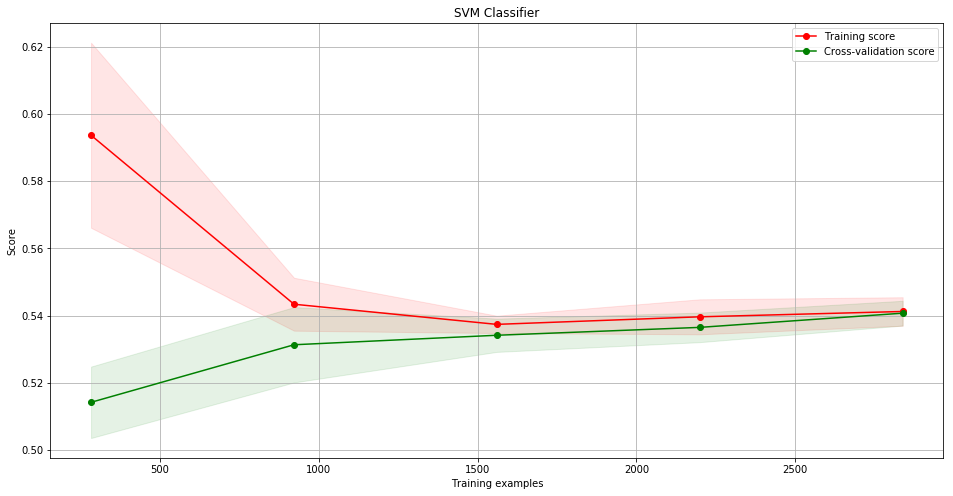

In [423]:
plot_learning_curve(clf_svm["best_model"], 
                        "SVM Classifier", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

A tabela abaixo indica os valores das métricas utilizadas para avaliar os estimadores. 
SVM deu um resultado ruim em todas as classes, errando 100% dos vinhos de qualidade, 3, 4, 8 e 9
A precisão do modelo foi de **44%**


In [424]:
clf_svm["model_report"]

,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,0.000000,0.000000,0.000000,71.0,71.0
5,0.573925,0.623358,0.597621,685.0,685.0
6,0.499257,0.731230,0.593377,919.0,919.0
7,0.200000,0.005698,0.011080,351.0,351.0
8,0.000000,0.000000,0.000000,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.439122,0.524286,0.456463,2100.0,2100.0


[[  0   0   5   4   0   0   0]
 [  0   0  43  27   1   0   0]
 [  0   0 427 258   0   0   0]
 [  0   0 243 672   4   0   0]
 [  0   0  17 332   2   0   0]
 [  0   0   9  52   2   0   0]
 [  0   0   0   1   1   0   0]]


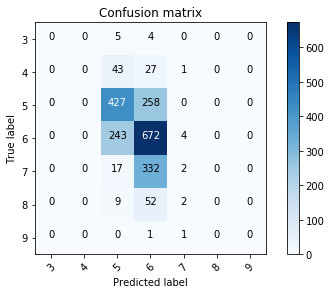

In [425]:
plot_confusion_matrix(clf_svm["confusion_matrix"], ["3","4","5","6","7","8","9"])

## xGBoost

In [426]:
param_grid= {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        }
model = xgb.XGBClassifier()
clf_xgboost = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

In [427]:
clf_xgboost["best_params"]

{'colsample_bytree': 1.0,
 'gamma': 0.5,
 'max_depth': 5,
 'min_child_weight': 1,
 'subsample': 0.6}

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

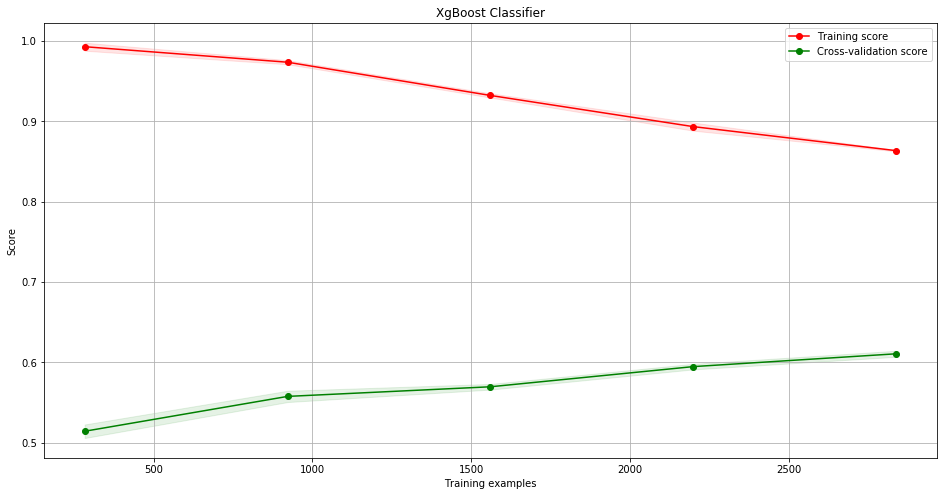

In [428]:
plot_learning_curve(clf_xgboost["best_model"], 
                        "XgBoost Classifier", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

O modelo obteve **62.6%** de precisão , porém prevendo erroneamente todos os casos dos vinhos de qualidade 3 e 9;

In [429]:
clf_xgboost["model_report"]

,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,0.583333,0.098592,0.168675,71.0,71.0
5,0.659401,0.706569,0.682171,685.0,685.0
6,0.607664,0.724701,0.661042,919.0,919.0
7,0.600858,0.398860,0.479452,351.0,351.0
8,0.800000,0.317460,0.454545,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.625167,0.627143,0.611278,2100.0,2100.0


[[  0   0   7   2   0   0   0]
 [  0   7  42  19   3   0   0]
 [  0   4 484 191   6   0   0]
 [  0   0 187 666  63   3   0]
 [  0   0  13 196 140   2   0]
 [  0   1   1  22  19  20   0]
 [  0   0   0   0   2   0   0]]


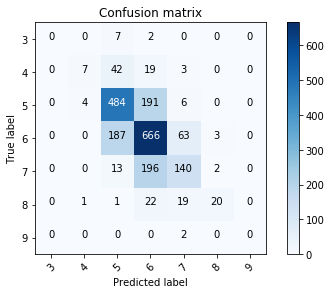

In [430]:
plot_confusion_matrix(clf_xgboost["confusion_matrix"], ["3","4","5","6","7","8","9"])

In [431]:
clf_xgboost["best_model"].feature_importances_

array([0.06839339, 0.06624627, 0.17196926, 0.07376118, 0.06586183,
       0.11340986, 0.06356557, 0.07036393, 0.06750709, 0.07081181,
       0.07587024, 0.09223948], dtype=float32)

Text(0.5,1,'xGBoost - Feature Importance')

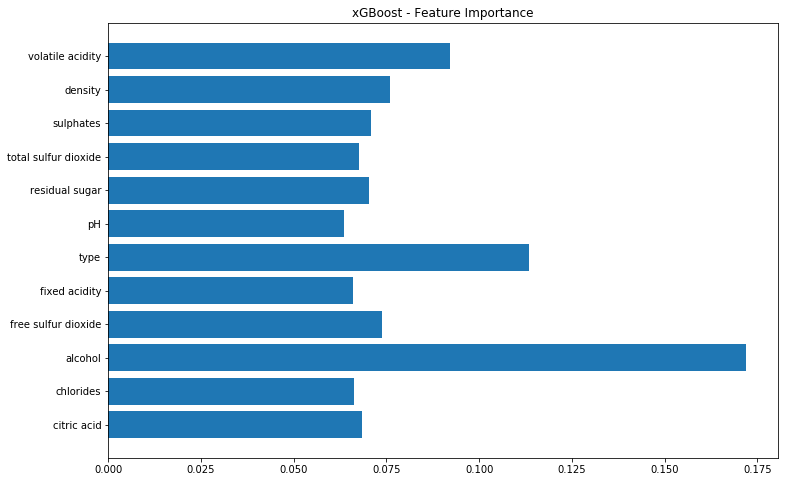

In [432]:
fig = plt.figure(figsize=(12,8))
plt.barh(['citric acid', 'chlorides', 'alcohol', 'free sulfur dioxide', 'fixed acidity','type','pH','residual sugar','total sulfur dioxide','sulphates','density','volatile acidity'], clf_xgboost["best_model"].feature_importances_ , align='center')
plt.title('xGBoost - Feature Importance')

### Gaussian Naive Bayes

In [433]:
model = GaussianNB()
param_grid = {}
clf_mnb = model_fit_transform_and_eval(model,param_grid,cv, X_traincv, y_traincv, X_testcv, y_testcv)



<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

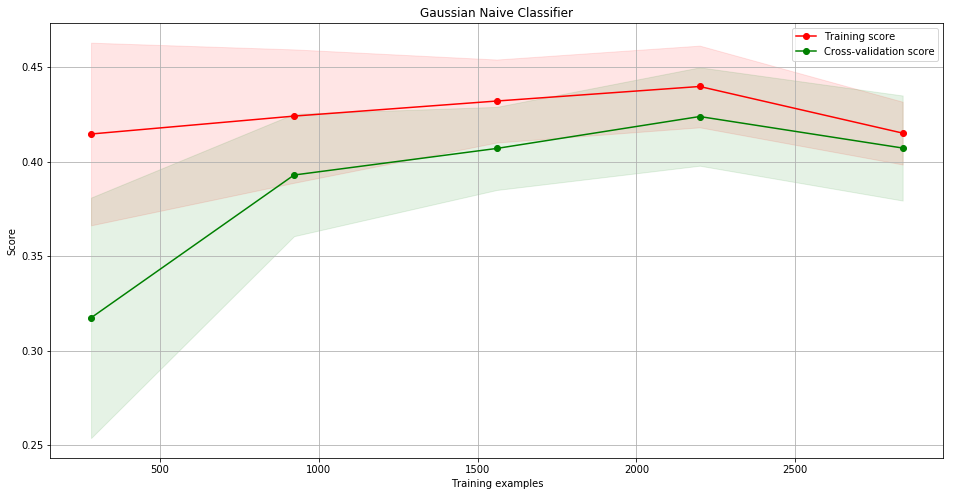

In [434]:
plot_learning_curve(clf_mnb["best_model"], 
                        "Gaussian Naive Classifier", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

In [435]:
clf_mnb["model_report"]

,precision,recall,f1-score,support,pred
3,0.115385,0.333333,0.171429,9.0,9.0
4,0.250000,0.126761,0.168224,71.0,71.0
5,0.505882,0.564964,0.533793,685.0,685.0
6,0.455814,0.319913,0.375959,919.0,919.0
7,0.270186,0.247863,0.258544,351.0,351.0
8,0.106870,0.222222,0.144330,63.0,63.0
9,0.005714,0.500000,0.011299,2.0,2.0
avg / total,0.421805,0.378571,0.392622,2100.0,2100.0


[[  3   2   1   2   1   0   0]
 [  3   9  22  26   7   0   4]
 [ 10  12 387 197  49   7  23]
 [  9  10 312 294 158  50  86]
 [  1   2  34 111  87  60  56]
 [  0   1   9  15  19  14   5]
 [  0   0   0   0   1   0   1]]


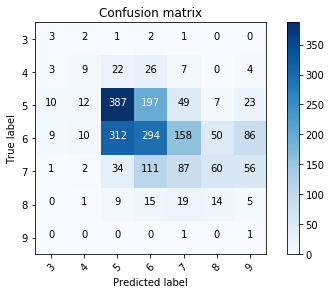

In [436]:
plot_confusion_matrix(clf_mnb["confusion_matrix"], ["3","4","5","6","7","8","9"])

###  Comparação dos algoritmos

Text(0.5,1,'Comparação dos Algoritmos - Precisão')

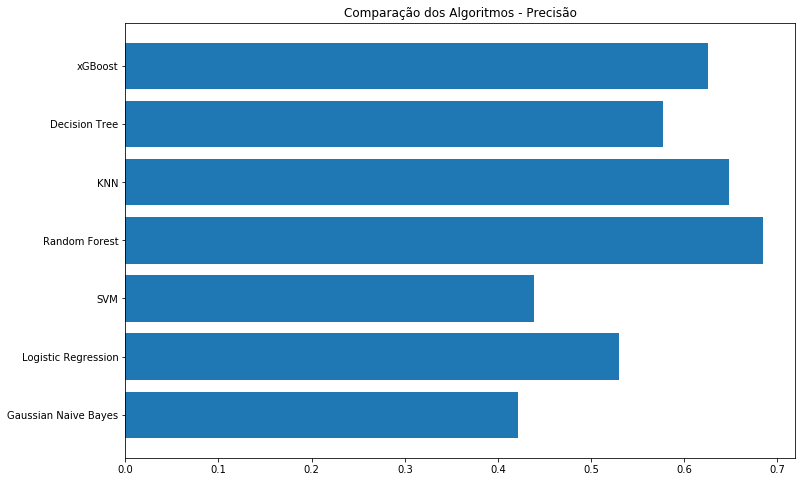

In [437]:
fig = plt.figure(figsize=(12,8))
plt.barh(['Gaussian Naive Bayes', 'Logistic Regression', 'SVM', 'Random Forest', 'KNN','Decision Tree','xGBoost'], [clf_mnb["model_report"]["precision"].loc["avg / total"],clf_logistic_regression["model_report"]["precision"].loc["avg / total"],clf_svm["model_report"]["precision"].loc["avg / total"],clf_random_forest["model_report"]["precision"].loc["avg / total"],clf_knn["model_report"]["precision"].loc["avg / total"],clf_decision_tree["model_report"]["precision"].loc["avg / total"],clf_xgboost["model_report"]["precision"].loc["avg / total"]], align='center')
plt.title('Comparação dos Algoritmos - Precisão')

## Utilizando PCA

* Podemos reduzir o número de features, perdendo um pouco da qualidade dos dados, com objetivo de tornar o modelo não somente mais fácil mas também com menos features, o que pode tornar os dados mais claros para serem analizados e otimizados pelos algoritmos. Basicamente iremos representar nossos dados no espaço dos autovetores da matrix X das features.

* Iremos tentar manter 95% da variância e obter o número de componentes necessárias para isso.

In [438]:
pca = PCA(.95)
pca.fit(X_traincv)
X_traincv_pca = pca.transform(X_traincv)
X_testcv_pca = pca.transform(X_testcv)

**Para manter 95% da variância, precisamos de 9 componentes (antes eram 12):**


In [439]:
pca.n_components_

9

Vamos escolher os melhores parâmetros utilizando GridSearch, no primeiro modelo que testamos (One Vs The Rest com Regressão Logística)

In [440]:
Cs = np.linspace(0.1,100,40)
param_grid=dict(estimator__C=Cs, estimator__penalty=["l1","l2"],estimator__class_weight=["balanced",None])
model = OneVsRestClassifier(LogisticRegression())
clf_logistic_regression_pca  = model_fit_transform_and_eval(model,param_grid,cv, X_traincv_pca, y_traincv, X_testcv_pca, y_testcv)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [441]:
clf_logistic_regression_pca["best_params"]

{'estimator__C': 2.661538461538462,
 'estimator__class_weight': None,
 'estimator__penalty': 'l1'}

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

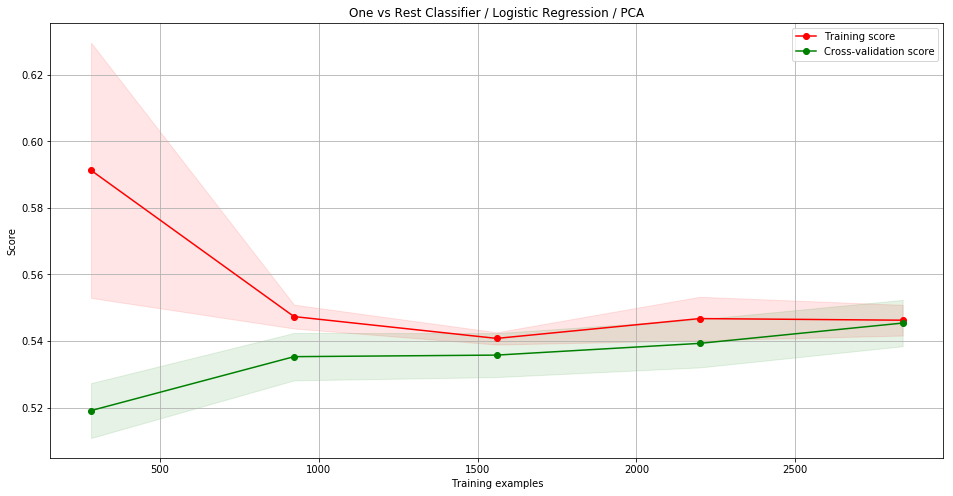

In [442]:
plot_learning_curve(clf_logistic_regression_pca["best_model"], 
                        "One vs Rest Classifier / Logistic Regression / PCA", 
                        X_traincv, 
                        y_traincv,
                        cv=cv)

O algoritmo obteve **51%** de precisão geral, obtendo um **resultado inferior** ao primeiro algoritmo utilizado

In [443]:
clf_logistic_regression_pca["model_report"]

,precision,recall,f1-score,support,pred
3,0.000000,0.000000,0.000000,9.0,9.0
4,0.000000,0.000000,0.000000,71.0,71.0
5,0.580027,0.618978,0.598870,685.0,685.0
6,0.509009,0.737758,0.602399,919.0,919.0
7,0.583333,0.059829,0.108527,351.0,351.0
8,0.000000,0.000000,0.000000,63.0,63.0
9,0.000000,0.000000,0.000000,2.0,2.0
avg / total,0.509451,0.534762,0.477106,2100.0,2100.0


In [444]:
clf_logistic_regression_pca["best_params"]

{'estimator__C': 2.661538461538462,
 'estimator__class_weight': None,
 'estimator__penalty': 'l1'}

[[  0   0   5   3   0   1   0]
 [  0   0  43  27   1   0   0]
 [  0   0 424 260   1   0   0]
 [  0   0 233 678   8   0   0]
 [  0   0  17 313  21   0   0]
 [  0   0   9  49   5   0   0]
 [  0   0   0   2   0   0   0]]


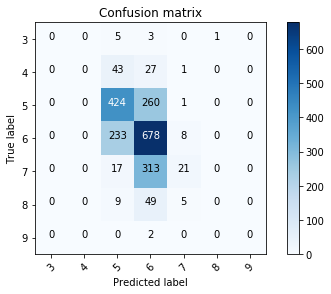

In [445]:
plot_confusion_matrix(clf_logistic_regression_pca["confusion_matrix"], ["3","4","5","6","7","8","9"])

# Modelagem 2 (Classificando os vinhos em Ruins, Médios ou Bons)

**Nesse caso, iremos classificar somente os vinhos em Ruins, Médios ou Ótimos**


### One vs The Rest com Regressão Logística

In [446]:
df2 = prepare_data(df,["quality_label","quality"])
x = df2.loc[:,list(set(df2.columns)-set(["quality_category"]))].values
y = df2.loc[:,"quality_category"].values
            
cv = model_selection.StratifiedKFold(n_splits=3)

X_traincv2, X_testcv2, y_traincv2, y_testcv2 = model_selection.train_test_split(x,
                                                                            y,
                                                                            test_size=0.33,
                                                                            random_state=4,
                                                                            stratify=y)


In [447]:
Cs = np.linspace(0.1,100,40)
param_grid=dict(estimator__C=Cs, estimator__penalty=["l1","l2"],estimator__class_weight=["balanced",None])
model = OneVsRestClassifier(LogisticRegression())
clf_logistic_regression2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)

In [448]:
clf_logistic_regression2["best_params"]

{'estimator__C': 7.784615384615385,
 'estimator__class_weight': None,
 'estimator__penalty': 'l2'}

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

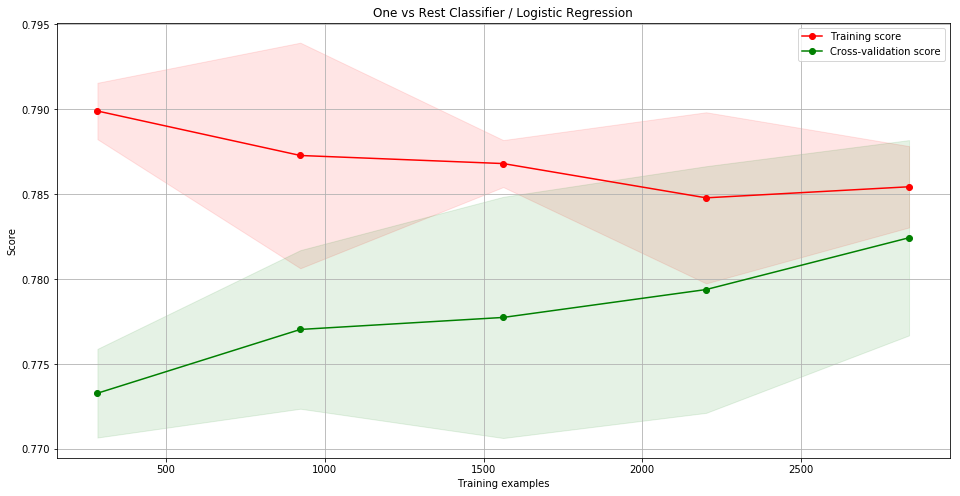

In [449]:
plot_learning_curve(clf_logistic_regression2["best_model"], 
                        "One vs Rest Classifier / Logistic Regression", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

O algoritmo obteve **76.1%** de precisão, acertando todos os vinhos de qualidade ruim.

In [450]:
clf_logistic_regression2["model_report"]

,precision,recall,f1-score,support,pred
0,1.000000,0.012500,0.024691,80.0,80.0
1,0.798640,0.951995,0.868601,1604.0,1604.0
2,0.572193,0.257212,0.354892,416.0,416.0
avg / total,0.761453,0.778571,0.734689,2100.0,2100.0


[[   1   76    3]
 [   0 1527   77]
 [   0  309  107]]


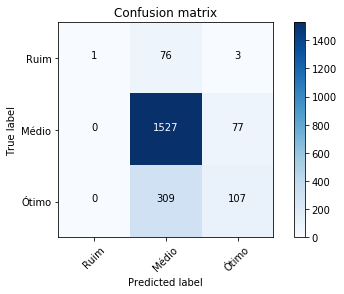

In [451]:
plot_confusion_matrix(clf_logistic_regression2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

### Random Forest

In [452]:
model = RandomForestClassifier()
param_grid = {"class_weight":["balanced",None],'bootstrap': [True, False],
 'max_depth': [10, 20, 30, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [400, 600, 800]}

clf_random_forest2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)


In [453]:
clf_random_forest2["best_params"]

{'bootstrap': True,
 'class_weight': 'balanced',
 'max_depth': 30,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 400}

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

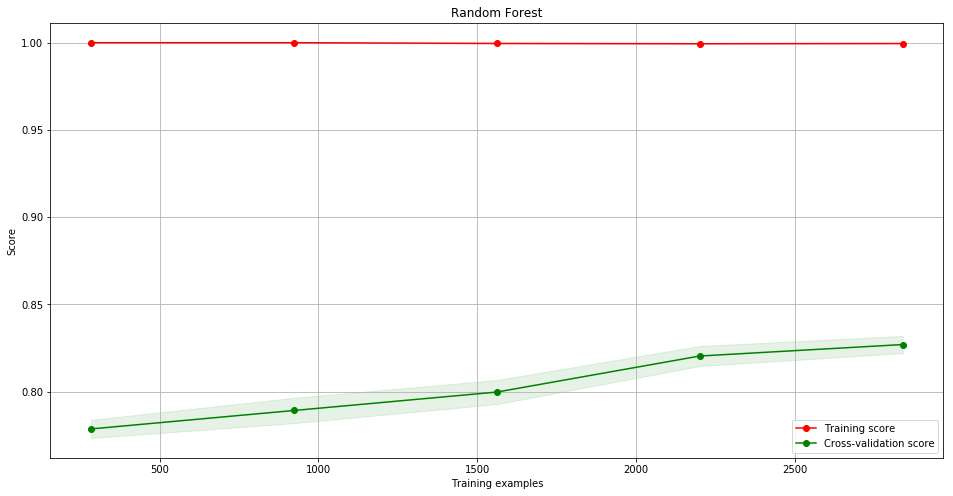

In [454]:
plot_learning_curve(clf_random_forest2["best_model"], 
                        "Random Forest", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

O algoritmo obteve **83.9%** de precisão, obtendo melhor resultado prevendo os vinhos de qualidade média.

In [455]:
clf_random_forest2["model_report"]

,precision,recall,f1-score,support,pred
0,0.833333,0.125000,0.217391,80.0,80.0
1,0.852568,0.962594,0.904246,1604.0,1604.0
2,0.787004,0.524038,0.629149,416.0,416.0
avg / total,0.838847,0.843810,0.823585,2100.0,2100.0


[[  10   69    1]
 [   2 1544   58]
 [   0  198  218]]


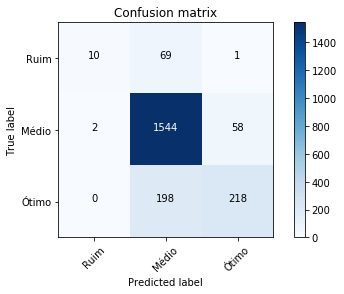

In [456]:
plot_confusion_matrix(clf_random_forest2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

### xGBoost

In [457]:
param_grid= {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        }
model = xgb.XGBClassifier()
clf_xgboost2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

In [458]:
clf_xgboost2["best_params"]

{'colsample_bytree': 1.0,
 'gamma': 0.5,
 'max_depth': 5,
 'min_child_weight': 1,
 'subsample': 0.6}

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array 

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

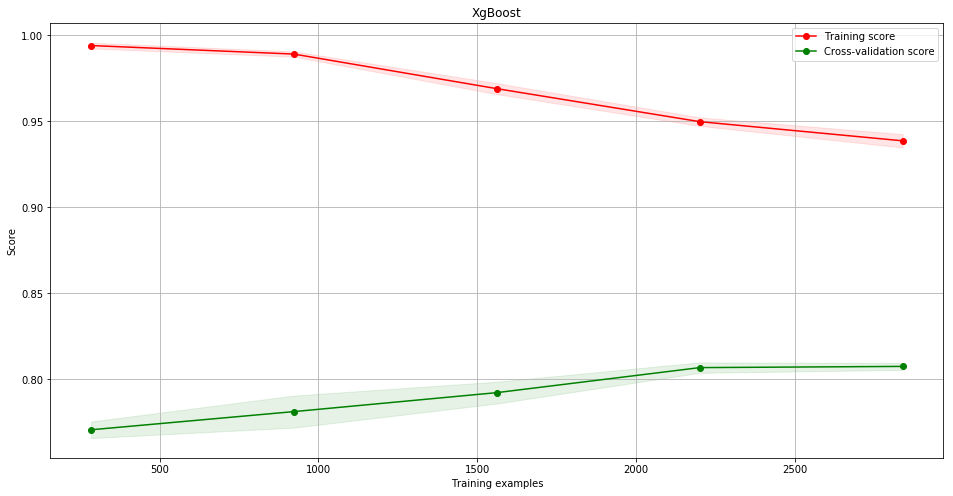

In [459]:
plot_learning_curve(clf_xgboost2["best_model"], 
                        "XgBoost", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

O algoritmo obteve **80.1%** de precisão, obtendo um resultado ruim nos vinhos de qualidade ruim.

In [460]:
clf_xgboost2["model_report"]

,precision,recall,f1-score,support,pred
0,0.454545,0.062500,0.109890,80.0,80.0
1,0.840331,0.948254,0.891037,1604.0,1604.0
2,0.716846,0.480769,0.575540,416.0,416.0
avg / total,0.801173,0.821905,0.798780,2100.0,2100.0


[[   5   73    2]
 [   6 1521   77]
 [   0  216  200]]


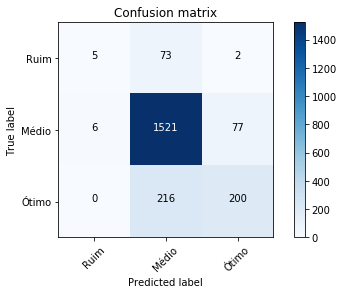

In [461]:
plot_confusion_matrix(clf_xgboost2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

### Árvore de Decisão

In [462]:
model = DecisionTreeClassifier()
param_grid = {"class_weight":["balanced",None],
 'max_depth': range(1,40),
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1,2,3,4],
 'min_samples_split': [2, 5, 10]
}

clf_decision_tree2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)

In [463]:
clf_decision_tree2["best_params"]

{'class_weight': 'balanced',
 'max_depth': 31,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2}

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

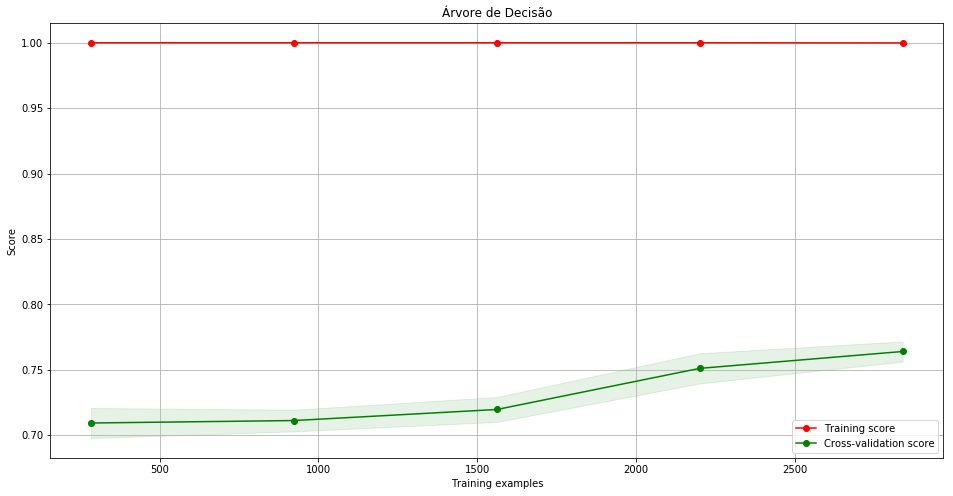

In [464]:
plot_learning_curve(clf_decision_tree2["best_model"], 
                        "Árvore de Decisão", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

O algoritmo obteve uma precisão de **78.0%**, com resultado ruim nos vinhos de qualidade baixa (25.8%)

In [465]:
clf_decision_tree2["model_report"]

,precision,recall,f1-score,support,pred
0,0.258065,0.200000,0.225352,80.0,80.0
1,0.856793,0.872818,0.864731,1604.0,1604.0
2,0.586634,0.569712,0.578049,416.0,416.0
avg / total,0.780467,0.787143,0.783584,2100.0,2100.0


[[  16   58    6]
 [  43 1400  161]
 [   3  176  237]]


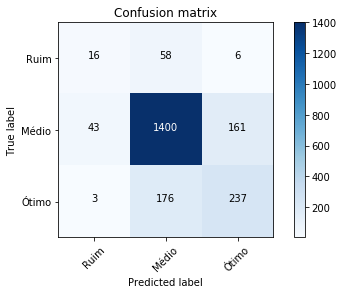

In [466]:
plot_confusion_matrix(clf_decision_tree2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

### K - Nearest Neighbors

In [467]:
metrics       = ['minkowski','euclidean','manhattan'] 
weights       = ['uniform','distance'] #10.0**np.arange(-5,4)
numNeighbors  = np.arange(5,12)
model = KNeighborsClassifier()
param_grid    = dict(metric=metrics,weights=weights,n_neighbors=numNeighbors)

clf_knn2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)

In [468]:
clf_knn2["best_params"]

{'metric': 'minkowski', 'n_neighbors': 11, 'weights': 'distance'}

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

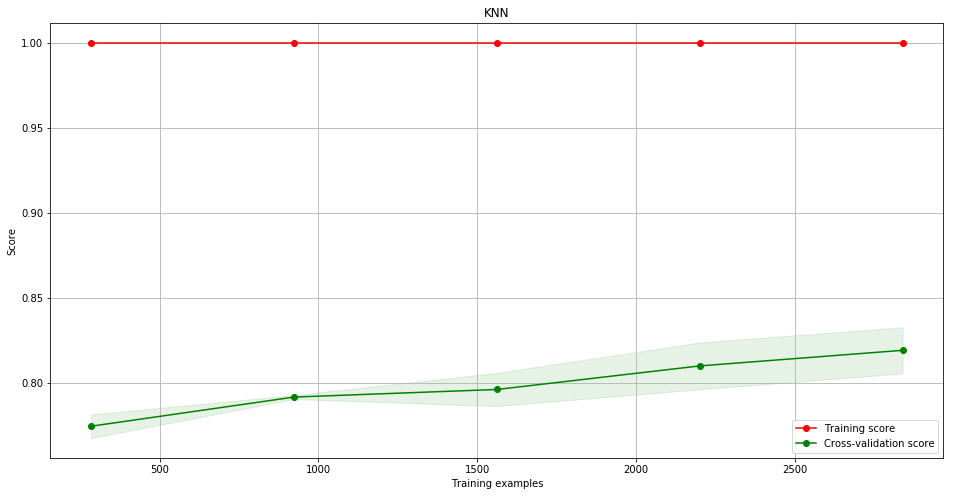

In [469]:
plot_learning_curve(clf_knn2["best_model"], 
                        "KNN", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

O algoritmo obteve precisão de **82.3%** prevendo melhor os vinhos de qualidade média

In [470]:
clf_knn2["model_report"]

,precision,recall,f1-score,support,pred
0,0.750000,0.112500,0.195652,80.0,80.0
1,0.855442,0.940773,0.896081,1604.0,1604.0
2,0.712963,0.555288,0.624324,416.0,416.0
avg / total,0.823201,0.832857,0.815564,2100.0,2100.0


[[   9   70    1]
 [   3 1509   92]
 [   0  185  231]]


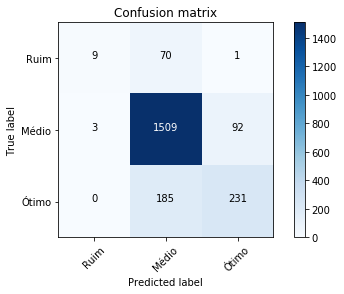

In [471]:
plot_confusion_matrix(clf_knn2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

### SVM

In [472]:
model = LinearSVC(multi_class='ovr')

Cs = np.linspace(0.1,100,200)
gammas = np.logspace(-5, 0, 10)

param_grid=dict(C=Cs, class_weight=["balanced",None])

clf_svm2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)

/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/lexlabs/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [473]:
clf_svm2["best_params"]

{'C': 21.686432160804024, 'class_weight': None}

<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

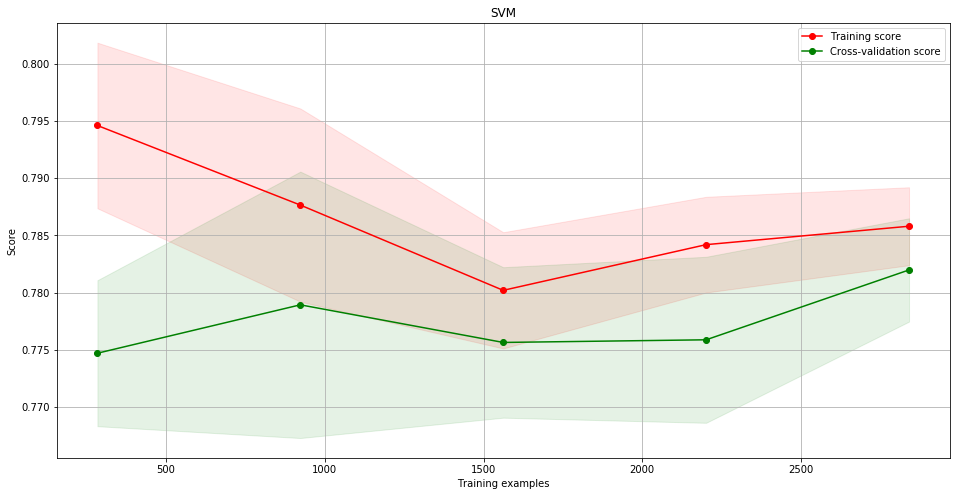

In [474]:
plot_learning_curve(clf_svm2["best_model"], 
                        "SVM", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

O modelo obteve **72.1%** de precisão, porem resultado ruim nos vinhos de qualidade baixa

In [475]:
clf_svm2["model_report"]

,precision,recall,f1-score,support,pred
0,0.000000,0.000000,0.000000,80.0,80.0
1,0.790816,0.966334,0.869809,1604.0,1604.0
2,0.592857,0.199519,0.298561,416.0,416.0
avg / total,0.721475,0.777619,0.723512,2100.0,2100.0


[[   0   77    3]
 [   0 1550   54]
 [   0  333   83]]


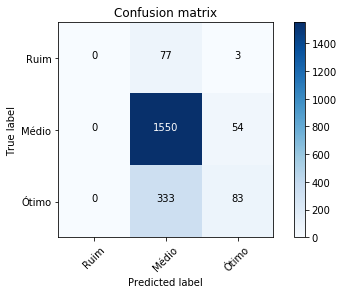

In [476]:
plot_confusion_matrix(clf_svm2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

In [477]:
model = GaussianNB()
param_grid = {}
clf_mnb2 = model_fit_transform_and_eval(model,param_grid,cv, X_traincv2, y_traincv2, X_testcv2, y_testcv2)


<module 'matplotlib.pyplot' from '/home/lexlabs/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

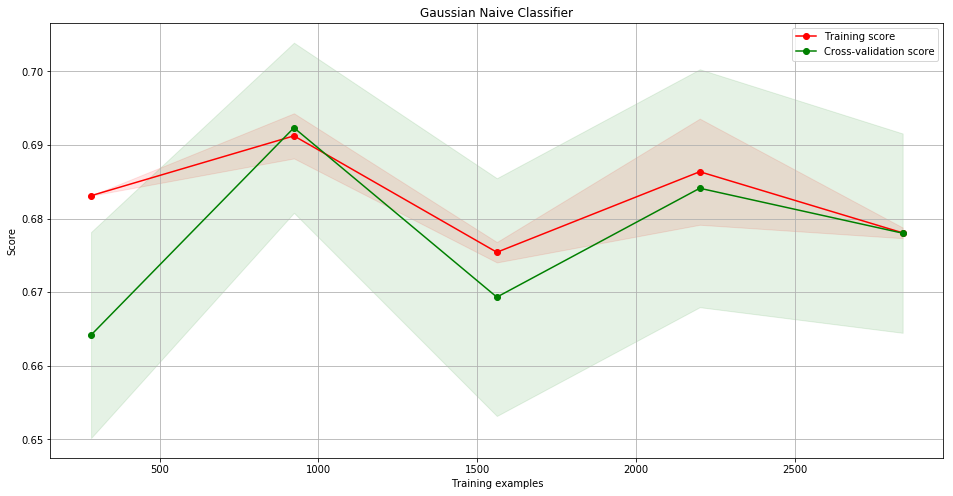

In [478]:
plot_learning_curve(clf_mnb2["best_model"], 
                        "Gaussian Naive Classifier", 
                        X_traincv2, 
                        y_traincv2,
                        cv=cv)

In [479]:
clf_mnb2["model_report"]


,precision,recall,f1-score,support,pred
0,0.136842,0.162500,0.148571,80.0,80.0
1,0.863910,0.716334,0.783231,1604.0,1604.0
2,0.398519,0.646635,0.493126,416.0,416.0
avg / total,0.744020,0.681429,0.701585,2100.0,2100.0


[[  13   43   24]
 [  73 1149  382]
 [   9  138  269]]


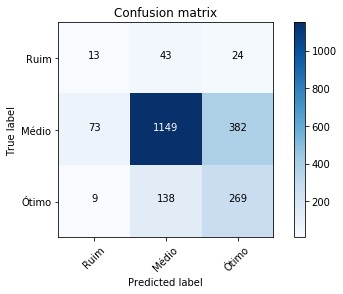

In [480]:
plot_confusion_matrix(clf_mnb2["confusion_matrix"], ["Ruim","Médio","Ótimo"])

### Comparação dos Algoritmos

Text(0.5,1,'Comparação dos Algoritmos - Precisão')

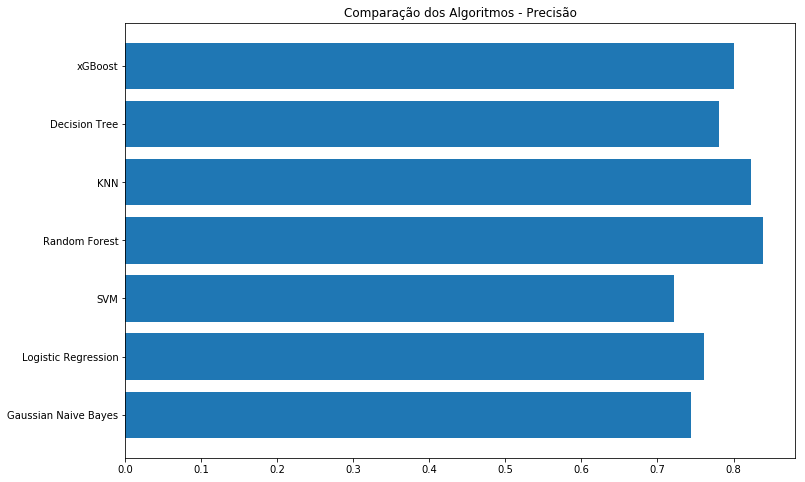

In [481]:
fig = plt.figure(figsize=(12,8))
plt.barh(['Gaussian Naive Bayes', 'Logistic Regression', 'SVM', 'Random Forest', 'KNN','Decision Tree','xGBoost'], [clf_mnb2["model_report"]["precision"].loc["avg / total"],clf_logistic_regression2["model_report"]["precision"].loc["avg / total"],clf_svm2["model_report"]["precision"].loc["avg / total"],clf_random_forest2["model_report"]["precision"].loc["avg / total"],clf_knn2["model_report"]["precision"].loc["avg / total"],clf_decision_tree2["model_report"]["precision"].loc["avg / total"],clf_xgboost2["model_report"]["precision"].loc["avg / total"]], align='center')
plt.title('Comparação dos Algoritmos - Precisão')